In [ ]:
# ссылка на датасет:
# https://drive.google.com/drive/folders/1SXRgjp-WxDx6yAHtEB33pejpO9hyZWqy?usp=sharing

# 0. Функции

In [ ]:
# функции преобразования
def balloon2yolo(xmin,ymin, xmax, ymax, image_width, image_height):
    x = (xmin + xmax)/2.0/image_width   #координата центра объекта по x
    y = (ymin + ymax)/2.0/image_height  #координата центра объекта по y
    w = (xmax - xmin)/image_width       #ширина объекта
    h = (ymax - ymin)/image_height      #высота объекта
    return x,y,w,h

# функция удаления файлов в папке заданного расширения
def delete_files(dir_name, extension):
  dir = os.listdir(dir_name)
  for item in dir:
      if item.endswith(extension):
          os.remove(os.path.join(dir_name, item))

# функция переноса файлов заданного расширения из old папки в new папку
def move_files(folder_old, folder_new, ends):
  dir = os.listdir(folder_old)
  for item in dir:
      if item.endswith(ends):
          os.rename(os.path.join(folder_old, item), os.path.join(folder_new, item))

# функция создания упорядоченного списка содержимого папки
def list_folder(path):
  dir_list = os.listdir(path)
  dir_list.sort()

  lisstt = []
  for dir in dir_list:
    directory = path + '/' + dir
    print(directory)
    lisstt.append(list(glob.glob(os.path.join(directory,'*.*'))))

  for i in range(len(lisstt)):
    lisstt[i].sort()

  return lisstt

# функция преобразования json в txt формат
def convert_json_in_txt(i):
  for j in range(len(list_json[i])):
    file_ann = os.path.splitext(list_json[i][j])[0]+'.txt'
    # файл разметки
    with open(list_json[i][j], 'r') as json_file:
        data_js = json.load(json_file)
    # кол-во объектов
    lengh_ = len(data_js["outputs"]['object'])
    # параметры разметки
    string = ''
    for m in range(lengh_):
      xmin = data_js["outputs"]['object'][m]['bndbox'].get('xmin')
      ymin = data_js["outputs"]['object'][m]['bndbox'].get('ymin')
      xmax = data_js["outputs"]['object'][m]['bndbox'].get('xmax')
      ymax = data_js["outputs"]['object'][m]['bndbox'].get('ymax')
      width = data_js["size"].get('width')
      height = data_js["size"].get('height')
      x,y,w,h = balloon2yolo(xmin, ymin, xmax, ymax, width, height)

      category_id = i # вроде доделал ...

      content =f"{category_id} {x} {y} {w} {h}\n"
      string = string + content
      with open(file_ann, 'w') as f:
          f.write(string[:-1])  # without last '\n' symbol

def yolo2bbox(bboxes):
    xmin, ymin = bboxes[0]-bboxes[2]/2, bboxes[1]-bboxes[3]/2
    xmax, ymax = bboxes[0]+bboxes[2]/2, bboxes[1]+bboxes[3]/2
    return xmin, ymin, xmax, ymax

def plot_box(image, bboxes, labels):
    # Need the image height and width to denormalize
    # the bounding box coordinates
    h, w, _ = image.shape
    for box_num, box in enumerate(bboxes):
        x1, y1, x2, y2 = yolo2bbox(box)

        # denormalize the coordinates
        xmin = int(x1*w)
        ymin = int(y1*h)
        xmax = int(x2*w)
        ymax = int(y2*h)
        width = xmax - xmin
        height = ymax - ymin

        class_name = class_names[int(labels[box_num])]

        cv2.rectangle(image, (xmin, ymin), (xmax, ymax),
                      color=colors[class_names.index(class_name)],
                      thickness=2)

        font_scale = min(1,max(3,int(w/500)))
        font_thickness = min(2, max(10,int(w/50)))

        cv2.putText(image, class_name, (xmin+1, ymin-10),
                    cv2.FONT_HERSHEY_SIMPLEX,
                    font_scale, (0, 0, 0), font_thickness)
    return image

# Function to plot images with the bounding boxes.
def plot(image_paths, label_paths, num_samples):
    all_training_images = glob.glob(image_paths)
    all_training_labels = glob.glob(label_paths)
    all_training_images.sort()
    all_training_labels.sort()

    num_images = len(all_training_images)

    plt.figure(figsize=(8, 8))
    for i in range(num_samples):
        j = random.randint(0,num_images-1)
        image = cv2.imread(all_training_images[j])
        with open(all_training_labels[j], 'r') as f:
            bboxes = []
            labels = []
            label_lines = f.readlines()
            for label_line in label_lines:
                label = label_line[0]
                bbox_string = label_line[2:]
                x_c, y_c, w, h = bbox_string.split(' ')
                x_c = float(x_c)
                y_c = float(y_c)
                w = float(w)
                h = float(h)
                bboxes.append([x_c, y_c, w, h])
                labels.append(label)
        result_image = plot_box(image, bboxes, labels)
        plt.subplot(2, 2, i+1)
        plt.imshow(result_image[:, :, ::-1])
        plt.axis('off')
    plt.subplots_adjust(wspace=0)
    plt.tight_layout()
    plt.show()

def set_res_dir():
    # Directory to store results
    res_dir_count = len(glob.glob('runs/train/*'))
    print(f"Current number of result directories: {res_dir_count}")
    if TRAIN:
        RES_DIR = f"results_{res_dir_count+1}"
        print(RES_DIR)
    else:
        RES_DIR = f"results_{res_dir_count}"
    return RES_DIR

# 1. Data_Proc

## 1.1. Data i libraries

In [ ]:
!mkdir vkr

!mkdir vkr/img_zip
!mkdir vkr/json_zip
!mkdir vkr/img
!mkdir vkr/json

In [ ]:
import os
import shutil
import zipfile
import glob
import json
import numpy as np
import random
import cv2
import time

from PIL import Image
import matplotlib.pyplot as plt

import torch

from google.colab import drive
drive.mount('/content/drive')

from google.colab import files # для скачивания файлов

!sudo apt install tree

In [ ]:
!pwd

/content


In [ ]:
path = "/content/drive/MyDrive/ВКР/Dataset_MD"
%cd {path}
!pwd

/content/drive/MyDrive/ВКР/Dataset_MD
/content/drive/MyDrive/ВКР/Dataset_MD


## 1.1. Google disk

In [ ]:
!tree # (на гуглдиске)

.
├── img_air-hole
│   ├── img_air-hole_part_10.zip
│   ├── img_air-hole_part_11.zip
│   ├── img_air-hole_part_12.zip
│   ├── img_air-hole_part_13.zip
│   ├── img_air-hole_part_14.zip
│   ├── img_air-hole_part_15.zip
│   ├── img_air-hole_part_1.zip
│   ├── img_air-hole_part_2.zip
│   ├── img_air-hole_part_3.zip
│   ├── img_air-hole_part_4.zip
│   └── img_air-hole_part_7.zip
├── img_bite-edge
│   └── img_bite-edge_part_2.zip
├── img_broken-arc
│   ├── img_broken-arc_part_1.zip
│   ├── img_broken-arc_part_2.zip
│   └── img_broken-arc_part_3.zip
├── img_crack
│   └── img_crack.zip
├── img_overlap
│   └── img_overlap.zip
├── img_unfused
│   ├── img_unfused_part_1.zip
│   ├── img_unfused_part_2.zip
│   ├── img_unfused_part_3.zip
│   ├── img_unfused_part_4.zip
│   ├── img_unfused_part_5.zip
│   └── img_unfused_part_6.zip
├── json_air-hole
│   ├── json_air-hole_part_10.zip
│   ├── json_air-hole_part_11.zip
│   ├── json_air-hole_part_12.zip
│   ├── json_air-hole_part_13.zip
│   ├── json_air-ho

In [ ]:
# отобразил подпапки c img (на гуглдиске)
img_sub_path = []
folders_list = [folder for folder in os.listdir(path)
          if folder.startswith("img_")]
for i in folders_list:
  img_sub_path.append(path + '/' + i)
img_sub_path

['/content/drive/MyDrive/ВКР/Dataset_MD/img_air-hole',
 '/content/drive/MyDrive/ВКР/Dataset_MD/img_bite-edge',
 '/content/drive/MyDrive/ВКР/Dataset_MD/img_broken-arc',
 '/content/drive/MyDrive/ВКР/Dataset_MD/img_crack',
 '/content/drive/MyDrive/ВКР/Dataset_MD/img_overlap',
 '/content/drive/MyDrive/ВКР/Dataset_MD/img_unfused']

In [ ]:
# отобразил подпапки c json (на гуглдиске)
json_sub_path = []
folders_list = [folder for folder in os.listdir(path)
          if folder.startswith("json_")]
for i in folders_list:
  json_sub_path.append(path + '/' + i)
json_sub_path

['/content/drive/MyDrive/ВКР/Dataset_MD/json_air-hole',
 '/content/drive/MyDrive/ВКР/Dataset_MD/json_bite-edge',
 '/content/drive/MyDrive/ВКР/Dataset_MD/json_broken-arc',
 '/content/drive/MyDrive/ВКР/Dataset_MD/json_crack',
 '/content/drive/MyDrive/ВКР/Dataset_MD/json_overlap',
 '/content/drive/MyDrive/ВКР/Dataset_MD/json_unfused']

In [ ]:
# создал список с путями к архивам img (на гуглдиске)
img_zip_list = []
for i in img_sub_path:
  zips = os.listdir(i)
  for j in zips:
    road_img = i + '/' + j
    img_zip_list.append(road_img)
print(*img_zip_list, sep = "\n")
print('\n','count of zip = ', len(img_zip_list), sep = '')

/content/drive/MyDrive/ВКР/Dataset_MD/img_air-hole/img_air-hole_part_1.zip
/content/drive/MyDrive/ВКР/Dataset_MD/img_air-hole/img_air-hole_part_2.zip
/content/drive/MyDrive/ВКР/Dataset_MD/img_air-hole/img_air-hole_part_3.zip
/content/drive/MyDrive/ВКР/Dataset_MD/img_air-hole/img_air-hole_part_4.zip
/content/drive/MyDrive/ВКР/Dataset_MD/img_air-hole/img_air-hole_part_7.zip
/content/drive/MyDrive/ВКР/Dataset_MD/img_air-hole/img_air-hole_part_10.zip
/content/drive/MyDrive/ВКР/Dataset_MD/img_air-hole/img_air-hole_part_11.zip
/content/drive/MyDrive/ВКР/Dataset_MD/img_air-hole/img_air-hole_part_12.zip
/content/drive/MyDrive/ВКР/Dataset_MD/img_air-hole/img_air-hole_part_13.zip
/content/drive/MyDrive/ВКР/Dataset_MD/img_air-hole/img_air-hole_part_14.zip
/content/drive/MyDrive/ВКР/Dataset_MD/img_air-hole/img_air-hole_part_15.zip
/content/drive/MyDrive/ВКР/Dataset_MD/img_bite-edge/img_bite-edge_part_2.zip
/content/drive/MyDrive/ВКР/Dataset_MD/img_broken-arc/img_broken-arc_part_1.zip
/content/driv

In [ ]:
# создал список с путями к архивам json (на гуглдиске)
json_zip_list = []
for i in json_sub_path:
  zips = os.listdir(i)
  for j in zips:
    road_json = i + '/' + j
    json_zip_list.append(road_json)
print(*json_zip_list, sep = "\n")
print('\n','count of zip = ', len(json_zip_list), sep = '')

/content/drive/MyDrive/ВКР/Dataset_MD/json_air-hole/json_air-hole_part_1.zip
/content/drive/MyDrive/ВКР/Dataset_MD/json_air-hole/json_air-hole_part_2.zip
/content/drive/MyDrive/ВКР/Dataset_MD/json_air-hole/json_air-hole_part_3.zip
/content/drive/MyDrive/ВКР/Dataset_MD/json_air-hole/json_air-hole_part_4.zip
/content/drive/MyDrive/ВКР/Dataset_MD/json_air-hole/json_air-hole_part_7.zip
/content/drive/MyDrive/ВКР/Dataset_MD/json_air-hole/json_air-hole_part_10.zip
/content/drive/MyDrive/ВКР/Dataset_MD/json_air-hole/json_air-hole_part_11.zip
/content/drive/MyDrive/ВКР/Dataset_MD/json_air-hole/json_air-hole_part_12.zip
/content/drive/MyDrive/ВКР/Dataset_MD/json_air-hole/json_air-hole_part_13.zip
/content/drive/MyDrive/ВКР/Dataset_MD/json_air-hole/json_air-hole_part_14.zip
/content/drive/MyDrive/ВКР/Dataset_MD/json_air-hole/json_air-hole_part_15.zip
/content/drive/MyDrive/ВКР/Dataset_MD/json_bite-edge/json_bite-edge_part_2.zip
/content/drive/MyDrive/ВКР/Dataset_MD/json_broken-arc/json_broken-ar

## 1.1. CollabVM

In [ ]:
# загрузил данные img (на виртуальной машине)
path = '/content/vkr/img_zip'
for i in img_zip_list:
  shutil.copy2(i, path)

In [ ]:
# создал список с путями к архивам img (на виртуальной машине)
img_zip_list = []
for i in os.listdir(path):
  img_zip_list.append(path + '/' + i)
  img_zip_list.sort()
print(*img_zip_list, sep = "\n")
print('\n','count of zip = ', len(img_zip_list), sep = '')

/content/vkr/img_zip/img_air-hole_part_1.zip
/content/vkr/img_zip/img_air-hole_part_10.zip
/content/vkr/img_zip/img_air-hole_part_11.zip
/content/vkr/img_zip/img_air-hole_part_12.zip
/content/vkr/img_zip/img_air-hole_part_13.zip
/content/vkr/img_zip/img_air-hole_part_14.zip
/content/vkr/img_zip/img_air-hole_part_15.zip
/content/vkr/img_zip/img_air-hole_part_2.zip
/content/vkr/img_zip/img_air-hole_part_3.zip
/content/vkr/img_zip/img_air-hole_part_4.zip
/content/vkr/img_zip/img_air-hole_part_7.zip
/content/vkr/img_zip/img_bite-edge_part_2.zip
/content/vkr/img_zip/img_broken-arc_part_1.zip
/content/vkr/img_zip/img_broken-arc_part_2.zip
/content/vkr/img_zip/img_broken-arc_part_3.zip
/content/vkr/img_zip/img_crack.zip
/content/vkr/img_zip/img_overlap.zip
/content/vkr/img_zip/img_unfused_part_1.zip
/content/vkr/img_zip/img_unfused_part_2.zip
/content/vkr/img_zip/img_unfused_part_3.zip
/content/vkr/img_zip/img_unfused_part_4.zip
/content/vkr/img_zip/img_unfused_part_5.zip
/content/vkr/img_zip

In [ ]:
# загрузил данные json (на виртуальной машине)
path = '/content/vkr/json_zip'
for i in json_zip_list:
  shutil.copy2(i, path)

In [ ]:
# создал список с путями к архивам json (на виртуальной машине)
json_zip_list = []
for i in os.listdir(path):
  json_zip_list.append(path + '/' + i)
  json_zip_list.sort()
print(*json_zip_list, sep = "\n")
print('\n','count of zip = ', len(json_zip_list), sep = '')

/content/vkr/json_zip/json_air-hole_part_1.zip
/content/vkr/json_zip/json_air-hole_part_10.zip
/content/vkr/json_zip/json_air-hole_part_11.zip
/content/vkr/json_zip/json_air-hole_part_12.zip
/content/vkr/json_zip/json_air-hole_part_13.zip
/content/vkr/json_zip/json_air-hole_part_14.zip
/content/vkr/json_zip/json_air-hole_part_15.zip
/content/vkr/json_zip/json_air-hole_part_2.zip
/content/vkr/json_zip/json_air-hole_part_3.zip
/content/vkr/json_zip/json_air-hole_part_4.zip
/content/vkr/json_zip/json_air-hole_part_7.zip
/content/vkr/json_zip/json_bite-edge_part_2.zip
/content/vkr/json_zip/json_broken-arc_part_1.zip
/content/vkr/json_zip/json_broken-arc_part_2.zip
/content/vkr/json_zip/json_broken-arc_part_3.zip
/content/vkr/json_zip/json_crack.zip
/content/vkr/json_zip/json_overlap.zip
/content/vkr/json_zip/json_unfused_part_1.zip
/content/vkr/json_zip/json_unfused_part_2.zip
/content/vkr/json_zip/json_unfused_part_3.zip
/content/vkr/json_zip/json_unfused_part_4.zip
/content/vkr/json_zip/

In [ ]:
# распаковал данные img (на виртуальной машине)
path = '/content/vkr/img'
for i in img_zip_list:
  zip_f = zipfile.ZipFile(i,'r')
  zip_f.extractall(path=path)

In [ ]:
# создал список с путями к img (на виртуальной машине)
img_list = []
for i in os.listdir(path):
  img_list.append(path + '/' + i)
  img_list.sort()
print(*img_list, sep = "\n")
print('\n','count of folder = ', len(img_list), sep = '')

/content/vkr/img/img_air-hole_part_1
/content/vkr/img/img_air-hole_part_10
/content/vkr/img/img_air-hole_part_11
/content/vkr/img/img_air-hole_part_12
/content/vkr/img/img_air-hole_part_13
/content/vkr/img/img_air-hole_part_14
/content/vkr/img/img_air-hole_part_15
/content/vkr/img/img_air-hole_part_2
/content/vkr/img/img_air-hole_part_3
/content/vkr/img/img_air-hole_part_4
/content/vkr/img/img_air-hole_part_7
/content/vkr/img/img_bite-edge_part_2
/content/vkr/img/img_broken-arc_part_1
/content/vkr/img/img_broken-arc_part_2
/content/vkr/img/img_broken-arc_part_3
/content/vkr/img/img_crack
/content/vkr/img/img_overlap
/content/vkr/img/img_unfused_part_1
/content/vkr/img/img_unfused_part_2
/content/vkr/img/img_unfused_part_3
/content/vkr/img/img_unfused_part_4
/content/vkr/img/img_unfused_part_5
/content/vkr/img/img_unfused_part_6

count of folder = 23


In [ ]:
# распаковал данные json (на виртуальной машине)
path = '/content/vkr/json'
for i in json_zip_list:
  zip_f = zipfile.ZipFile(i,'r')
  zip_f.extractall(path=path)

In [ ]:
# создал список с путями к json (на виртуальной машине)
json_list = []
for i in os.listdir(path):
  json_list.append(path + '/' + i)
  json_list.sort()
print(*json_list, sep = "\n")
print('\n','count of folder = ', len(json_list), sep = '')

/content/vkr/json/json_air-hole_part_1
/content/vkr/json/json_air-hole_part_10
/content/vkr/json/json_air-hole_part_11
/content/vkr/json/json_air-hole_part_12
/content/vkr/json/json_air-hole_part_13
/content/vkr/json/json_air-hole_part_14
/content/vkr/json/json_air-hole_part_15
/content/vkr/json/json_air-hole_part_2
/content/vkr/json/json_air-hole_part_3
/content/vkr/json/json_air-hole_part_4
/content/vkr/json/json_air-hole_part_7
/content/vkr/json/json_bite-edge_part_2
/content/vkr/json/json_broken-arc_part_1
/content/vkr/json/json_broken-arc_part_2
/content/vkr/json/json_broken-arc_part_3
/content/vkr/json/json_crack
/content/vkr/json/json_overlap
/content/vkr/json/json_unfused_part_1
/content/vkr/json/json_unfused_part_2
/content/vkr/json/json_unfused_part_3
/content/vkr/json/json_unfused_part_4
/content/vkr/json/json_unfused_part_5
/content/vkr/json/json_unfused_part_6

count of folder = 23


In [ ]:
!pwd

/content/drive/MyDrive/ВКР/Dataset_MD


## 1.1. Data debugging (start)

In [ ]:
# удалил папки с zip архивами (чтобы не мешалось...)
!rm -rf /content/vkr/img_zip*
!rm -rf /content/vkr/json_zip*

In [ ]:
# выдержал однотипность
!mv '/content/vkr/img/img_crack' '/content/vkr/img/img_crack_part_1'
!mv '/content/vkr/img/img_overlap' '/content/vkr/img/img_overlap_part_1'
!mv '/content/vkr/json/json_crack' '/content/vkr/json/json_crack_part_1'
!mv '/content/vkr/json/json_overlap' '/content/vkr/json/json_overlap_part_1'

In [ ]:
# ПРОВЕРКА

# создал списки с подкаталогами
path_i = '/content/vkr/img'
subdir_i = glob.glob(path_i + '/*', recursive=True)
subdir_i.sort()

path_j = '/content/vkr/json'
subdir_j = glob.glob(path_j + '/*', recursive=True)
subdir_j.sort()

# подсчитал количество файлов в подкаталогах
print(f"{'': <18}| {'json': <5}| {'img': <5}| {'check': <5}")
print("-"*40)

list_count = []
for i in range(len(subdir_j)):
  sum_j = !ls {subdir_j[i]} | wc -l # количество файлов json в подкаталоге
  sum_i = !ls {subdir_i[i]} | wc -l # количество файлов img в подкаталоге
  list_count.append(int(sum_i[0]))

  if sum_j[0] == sum_i[0]:
    check = 'ok'
  else :
    check = 'alarm'

  check
  print(f"{subdir_j[i].split('/')[-1][5::]: <18}| {sum_j[0]: <5}| {sum_i[0]: <5}| {check: <5}")

                  | json | img  | check
----------------------------------------
air-hole_part_1   | 32   | 32   | ok   
air-hole_part_10  | 361  | 361  | ok   
air-hole_part_11  | 121  | 121  | ok   
air-hole_part_12  | 237  | 237  | ok   
air-hole_part_13  | 72   | 72   | ok   
air-hole_part_14  | 127  | 127  | ok   
air-hole_part_15  | 85   | 85   | ok   
air-hole_part_2   | 49   | 49   | ok   
air-hole_part_3   | 88   | 88   | ok   
air-hole_part_4   | 376  | 376  | ok   
air-hole_part_7   | 404  | 404  | ok   
bite-edge_part_2  | 35   | 35   | ok   
broken-arc_part_1 | 80   | 80   | ok   
broken-arc_part_2 | 167  | 167  | ok   
broken-arc_part_3 | 284  | 284  | ok   
crack_part_1      | 119  | 119  | ok   
overlap_part_1    | 219  | 219  | ok   
unfused_part_1    | 50   | 49   | alarm
unfused_part_2    | 48   | 48   | ok   
unfused_part_3    | 89   | 89   | ok   
unfused_part_4    | 80   | 80   | ok   
unfused_part_5    | 90   | 90   | ok   
unfused_part_6    | 59   | 60   | alarm

In [ ]:
sum(list_count)

3272

In [ ]:
# ПРАВКА 1
# файл "unfused06.jpg" заблудился - это дефект
os.rename(os.path.join('/content/vkr/img/img_unfused_part_6/unfused06.jpg'), \
          os.path.join('/content/vkr/img/img_unfused_part_1/unfused06.jpg'))

In [ ]:
# ПРАВКА 2
# файлы ниже не имеют bndbox - это дефект
# не стал морочится и просто эти файлы удалил
!rm -f /content/vkr/json/json_unfused_part_3/unfused3-36.json
!rm -f /content/vkr/json/json_unfused_part_3/unfused3-54.json
!rm -f /content/vkr/json/json_unfused_part_3/unfused3-66.json
!rm -f /content/vkr/json/json_unfused_part_3/unfused3-68.json
!rm -f /content/vkr/json/json_unfused_part_3/unfused3-70.json
!rm -f /content/vkr/json/json_unfused_part_3/unfused3-72.json
!rm -f /content/vkr/json/json_unfused_part_3/unfused3-80.json
!rm -f /content/vkr/json/json_unfused_part_5/unfused5-12.json

!rm -f /content/vkr/img/img_unfused_part_3/unfused3-36.jpg
!rm -f /content/vkr/img/img_unfused_part_3/unfused3-54.jpg
!rm -f /content/vkr/img/img_unfused_part_3/unfused3-66.jpg
!rm -f /content/vkr/img/img_unfused_part_3/unfused3-68.jpg
!rm -f /content/vkr/img/img_unfused_part_3/unfused3-70.jpg
!rm -f /content/vkr/img/img_unfused_part_3/unfused3-72.jpg
!rm -f /content/vkr/img/img_unfused_part_3/unfused3-80.jpg
!rm -f /content/vkr/img/img_unfused_part_5/unfused5-12.jpg

## 1.1. Data structure

In [ ]:
%cd /content

/content


In [ ]:
# !rm -rf /content/vkr/train
# !rm -rf /content/vkr/val
# !rm -rf /content/vkr/video
# !rm -rf /content/vkr/video_zip

In [ ]:
!mkdir /content/vkr/img/img_air-hole
!mkdir /content/vkr/img/img_unfused
!mkdir /content/vkr/img/img_broken-arc
!mkdir /content/vkr/json/json_air-hole
!mkdir /content/vkr/json/json_unfused
!mkdir /content/vkr/json/json_broken-arc

In [ ]:
parts = [1,2,3,4,7,10,11,12,13,14,15]

path_base = '/content/vkr/img/img_air-hole'
for i in parts:
  path = "/content/vkr/img/img_air-hole_part_" + str(i)
  !cp -rT {path} {path_base}
  !rm -rf {path}

path_base = '/content/vkr/json/json_air-hole'
for j in parts:
  path = "/content/vkr/json/json_air-hole_part_" + str(j)
  !cp -rT {path} {path_base}
  !rm -rf {path}

In [ ]:
parts = [1,2,3,4,5,6]

path_base = '/content/vkr/img/img_unfused'
for i in parts:
  path = "/content/vkr/img/img_unfused_part_" + str(i)
  !cp -rT {path} {path_base}
  !rm -rf {path}

path_base = '/content/vkr/json/json_unfused'
for j in parts:
  path = "/content/vkr/json/json_unfused_part_" + str(j)
  !cp -rT {path} {path_base}
  !rm -rf {path}

In [ ]:
parts = [1,2,3]

path_base = '/content/vkr/img/img_broken-arc'
for i in parts:
  path = "/content/vkr/img/img_broken-arc_part_" + str(i)
  !cp -rT {path} {path_base}
  !rm -rf {path}

path_base = '/content/vkr/json/json_broken-arc'
for j in parts:
  path = "/content/vkr/json/json_broken-arc_part_" + str(j)
  !cp -rT {path} {path_base}
  !rm -rf {path}

In [ ]:
!mv /content/vkr/img/img_bite-edge_part_2 /content/vkr/img/img_bite-edge
!mv /content/vkr/img/img_crack_part_1 /content/vkr/img/img_crack
!mv /content/vkr/img/img_overlap_part_1 /content/vkr/img/img_overlap
!mv /content/vkr/json/json_bite-edge_part_2 /content/vkr/json/json_bite-edge
!mv /content/vkr/json/json_crack_part_1 /content/vkr/json/json_crack
!mv /content/vkr/json/json_overlap_part_1 /content/vkr/json/json_overlap

In [ ]:
path = '/content/vkr/img'
dir_list = os.listdir(path)
dir_list.sort()

list_img = []
for dir in dir_list:
  directory = '/content/vkr/img/' + dir
  print(directory)
  list_img.append(list(glob.glob(os.path.join(directory,'*.*'))))

print()

for i in range(len(list_img)):
  list_img[i].sort()

for i in range(len(list_img)):
  print(len(list_img[i]))

/content/vkr/img/img_air-hole
/content/vkr/img/img_bite-edge
/content/vkr/img/img_broken-arc
/content/vkr/img/img_crack
/content/vkr/img/img_overlap
/content/vkr/img/img_unfused

1952
35
531
119
219
408


In [ ]:
path = '/content/vkr/json'
dir_list = os.listdir(path)
dir_list.sort()

list_json = []
for dir in dir_list:
  directory = '/content/vkr/json/' + dir
  print(directory)
  list_json.append(list(glob.glob(os.path.join(directory,'*.*'))))

print()

for i in range(len(list_json)):
  list_json[i].sort()

for i in range(len(list_json)):
  print(len(list_json[i]))

/content/vkr/json/json_air-hole
/content/vkr/json/json_bite-edge
/content/vkr/json/json_broken-arc
/content/vkr/json/json_crack
/content/vkr/json/json_overlap
/content/vkr/json/json_unfused

1952
35
531
119
219
408


In [ ]:
!mkdir /content/vkr/txt

In [ ]:
defect_type = {0: 'air-hole',
               1: 'bite-edge',
               2: 'broken-arc',
               3: 'crack',
               4: 'overlap',
               5: 'unfused'}

path_json = '/content/vkr/json/json_'
path_txt = '/content/vkr/txt/txt_'

In [ ]:
for j in range(6):
  convert_json_in_txt(j)
  !cp -rT {path_json + defect_type[j]} {path_txt + defect_type[j]}
  delete_files(path_json + defect_type[j],'.txt')
  delete_files(path_txt + defect_type[j],'.json')

In [ ]:
%cd /content/vkr/img
!find -type f | wc -l

%cd /content/vkr/json
!find -type f | wc -l

%cd /content/vkr/txt
!find -type f | wc -l

/content/vkr/img
3264
/content/vkr/json
3264
/content/vkr/txt
3264


In [ ]:
!rm -rf /content/vkr/json

In [ ]:
path = '/content/vkr/txt'
dir_list = os.listdir(path)
dir_list.sort()

list_txt = []
for dir in dir_list:
  directory = '/content/vkr/txt/' + dir
  print(directory)
  list_txt.append(list(glob.glob(os.path.join(directory,'*.*'))))

print()

for i in range(len(list_txt)):
  list_txt[i].sort()

for i in range(len(list_txt)):
  print(len(list_txt[i]))

/content/vkr/txt/txt_air-hole
/content/vkr/txt/txt_bite-edge
/content/vkr/txt/txt_broken-arc
/content/vkr/txt/txt_crack
/content/vkr/txt/txt_overlap
/content/vkr/txt/txt_unfused

1952
35
531
119
219
408


In [ ]:
# --- важный результат работы --- #

#    list_img
#    list_txt

# --- важный результат работы --- #

In [ ]:
!mv /content/vkr /content/train
!mv /content/train/img /content/train/images
!mv /content/train/txt /content/train/labels

The dataset is structured in the following manner:

```
├── train
    ├── images
    └── labels
```

In [ ]:
list_img = list_folder('/content/train/images')
print()
list_txt = list_folder('/content/train/labels')

/content/train/images/img_air-hole
/content/train/images/img_bite-edge
/content/train/images/img_broken-arc
/content/train/images/img_crack
/content/train/images/img_overlap
/content/train/images/img_unfused

/content/train/labels/txt_air-hole
/content/train/labels/txt_bite-edge
/content/train/labels/txt_broken-arc
/content/train/labels/txt_crack
/content/train/labels/txt_overlap
/content/train/labels/txt_unfused


In [ ]:
# проверка единой нумерации
print(*list_img[4][15:17], sep='\n')
print()
print(*list_txt[4][15:17], sep='\n')

/content/train/images/img_overlap/overlap015.jpg
/content/train/images/img_overlap/overlap016.jpg

/content/train/labels/txt_overlap/overlap015.txt
/content/train/labels/txt_overlap/overlap016.txt


In [ ]:
list_img_ = []
for i in range(len(list_img)):
  list_img_ += list_img[i]

list_txt_ = []
for i in range(len(list_txt)):
  list_txt_ += list_txt[i]

# для справки
print(len(list_img))
print(len(list_img_))

6
3264


In [ ]:
!cp -rT /content/train /content/val
!cp -rT /content/train /content/zapas

%cd /content/train
!find -type f | wc -l
%cd /content/val
!find -type f | wc -l
%cd /content/zapas
!find -type f | wc -l

/content/train
6528
/content/val
6528
/content/zapas
6528


## 1.1. Data (train i val)

In [ ]:
# train - list_img[0][:1548] list_img[1][:30] list_img[2][:247] list_img[3][:80] list_img[4][:170] list_img[5][:349]
# val  - list_img[0][1548:] list_img[1][30:] list_img[2][247:] list_img[3][80:] list_img[4][170:] list_img[5][349:]

In [ ]:
list_img_val = list_folder('/content/val/images')
list_txt_val = list_folder('/content/val/labels')

/content/val/images/img_air-hole
/content/val/images/img_bite-edge
/content/val/images/img_broken-arc
/content/val/images/img_crack
/content/val/images/img_overlap
/content/val/images/img_unfused
/content/val/labels/txt_air-hole
/content/val/labels/txt_bite-edge
/content/val/labels/txt_broken-arc
/content/val/labels/txt_crack
/content/val/labels/txt_overlap
/content/val/labels/txt_unfused


In [ ]:
list_img_val_ = []
for i in range(len(list_img_val)):
  list_img_val_ += list_img_val[i]

list_txt_val_ = []
for i in range(len(list_txt_val)):
  list_txt_val_ += list_txt_val[i]

# для справки
print(len(list_img_val))
print(len(list_img_val_))

6
3264


In [ ]:
doly = 8 # соотношение train и val

list_to_del_in_val = []
list_to_del_in_train = []

for i in range(len(list_img_val_)):
  if i % doly != 0:
    list_to_del_in_val.append(list_img_val_[i])

for i in range(len(list_txt_val_)):
  if i % doly != 0:
    list_to_del_in_val.append(list_txt_val_[i])

list_to_del_in_train = list_img_[::doly] + list_txt_[::doly]

print(len(list_to_del_in_val))
print(len(list_to_del_in_train))

5712
816


In [ ]:
# list_to_del_in_val = []
# list_to_del_in_val = \
# list_img_val[0][:1548] + \
# list_img_val[1][:30] + \
# list_img_val[2][:247] + \
# list_img_val[3][:80] + \
# list_img_val[4][:170] + \
# list_img_val[5][:349] + \
# list_json_val[0][:1548] + \
# list_json_val[1][:30] + \
# list_json_val[2][:247] + \
# list_json_val[3][:80] + \
# list_json_val[4][:170] + \
# list_json_val[5][:349] + \
# list_txt_val[0][:1548] + \
# list_txt_val[1][:30] + \
# list_txt_val[2][:247] + \
# list_txt_val[3][:80] + \
# list_txt_val[4][:170] + \
# list_txt_val[5][:349]
# len(list_to_del_in_val)

In [ ]:
# list_to_del_in_train = []
# list_to_del_in_train = \
# list_img[0][1548:] + \
# list_img[1][30:] + \
# list_img[2][247:] + \
# list_img[3][80:] + \
# list_img[4][170:] + \
# list_img[5][349:] + \
# list_json[0][1548:] + \
# list_json[1][30:] + \
# list_json[2][247:] + \
# list_json[3][80:] + \
# list_json[4][170:] + \
# list_json[5][349:] + \
# list_txt[0][1548:] + \
# list_txt[1][30:] + \
# list_txt[2][247:] + \
# list_txt[3][80:] + \
# list_txt[4][170:] + \
# list_txt[5][349:]
# len(list_to_del_in_train)

In [ ]:
for i in list_to_del_in_val:
  os.remove(i)
for i in list_to_del_in_train:
  os.remove(i)

In [ ]:
%cd /content/train
!find -type f | wc -l
%cd /content/val
!find -type f | wc -l
%cd /content/zapas
!find -type f | wc -l

/content/train
5712
/content/val
816
/content/zapas
6528


In [ ]:
list_all_val = []
list_i_val = list_folder('/content/val/images')
list_l_val = list_folder('/content/val/labels')

print()

list_all_train = []
list_i_train = list_folder('/content/train/images')
list_l_train = list_folder('/content/train/labels')

/content/val/images/img_air-hole
/content/val/images/img_bite-edge
/content/val/images/img_broken-arc
/content/val/images/img_crack
/content/val/images/img_overlap
/content/val/images/img_unfused
/content/val/labels/txt_air-hole
/content/val/labels/txt_bite-edge
/content/val/labels/txt_broken-arc
/content/val/labels/txt_crack
/content/val/labels/txt_overlap
/content/val/labels/txt_unfused

/content/train/images/img_air-hole
/content/train/images/img_bite-edge
/content/train/images/img_broken-arc
/content/train/images/img_crack
/content/train/images/img_overlap
/content/train/images/img_unfused
/content/train/labels/txt_air-hole
/content/train/labels/txt_bite-edge
/content/train/labels/txt_broken-arc
/content/train/labels/txt_crack
/content/train/labels/txt_overlap
/content/train/labels/txt_unfused


In [ ]:
list_i_val_ = []
for i in range(len(list_i_val)):
  list_i_val_ += list_i_val[i]
list_l_val_ = []
for i in range(len(list_l_val)):
  list_l_val_ += list_l_val[i]

list_all_val = list_i_val_ + list_l_val_

# --------------------------------

list_i_train_ = []
for i in range(len(list_i_train)):
  list_i_train_ += list_i_train[i]
list_l_train_ = []
for i in range(len(list_l_train)):
  list_l_train_ += list_l_train[i]

list_all_train = list_i_train_ + list_l_train_

print(len(list_all_val))
print(len(list_all_train))

816
5712


In [ ]:
# прополол, чтобы быстрее обучать

for i in list_all_val[::2]:
  try:
    os.remove(i)
  except FileNotFoundError:
    pass
for i in list_all_train[::2]:
  try:
    os.remove(i)
  except FileNotFoundError:
    pass

%cd /content/train
!find -type f | wc -l
%cd /content/val
!find -type f | wc -l
%cd /content/zapas
!find -type f | wc -l

/content/train
2856
/content/val
408
/content/zapas
6528


The dataset is structured in the following manner:

```
├── data.yaml
├── val
│   ├── images
│   └── labels
└── train
    ├── images
    └── labels
```

In [ ]:
class_names = ['air_hole',
               'bite_edge',
               'broken_arc',
               'crack',
               'overlap',
               'unfused']
colors = np.random.uniform(255, 0, size=(len(class_names), 3))

colors[0] = [255,32,0]    #blue
colors[1] = [16,160,255]  #orange
colors[2] = [0,192,0]     #green
colors[3] = [0,0,255]     #red
colors[4] = [255,32,160]  #purple
colors[5] = [96,128,160]  #brown

## 1.1. Визуализация

In [ ]:
%cd /content

/content


In [ ]:
%matplotlib inline

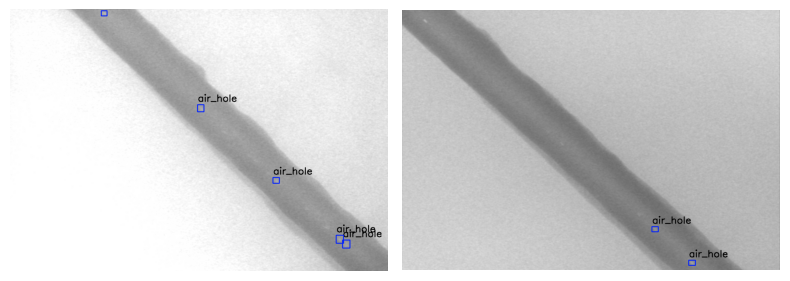

In [ ]:
plot(
    image_paths='train/images/img_air-hole/*',
    label_paths='train/labels/txt_air-hole/*',
    num_samples=2,
)

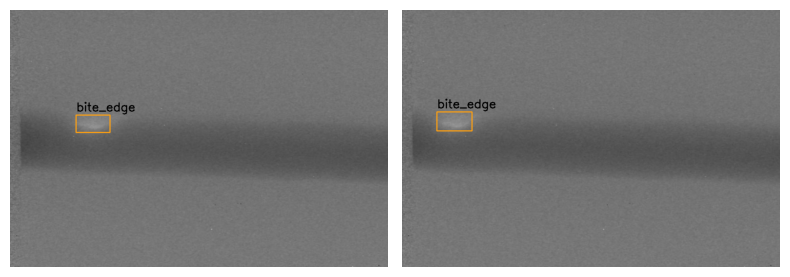

In [ ]:
plot(
    image_paths='train/images/img_bite-edge/*',
    label_paths='train/labels/txt_bite-edge/*',
    num_samples=2,
)

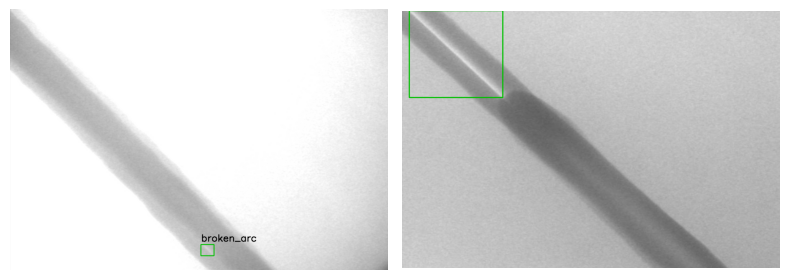

In [ ]:
plot(
    image_paths='train/images/img_broken-arc/*',
    label_paths='train/labels/txt_broken-arc/*',
    num_samples=2,
)

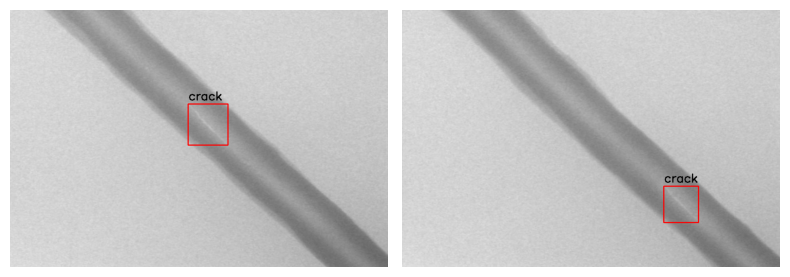

In [ ]:
plot(
    image_paths='train/images/img_crack/*',
    label_paths='train/labels/txt_crack/*',
    num_samples=2,
)

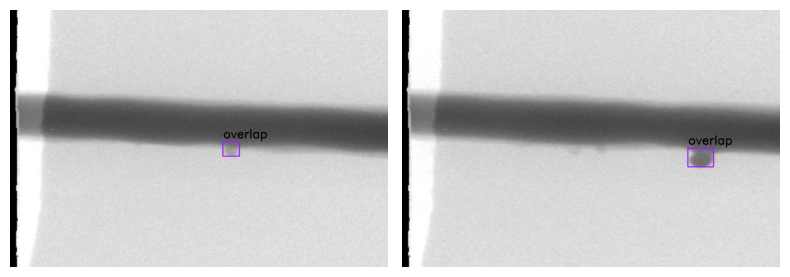

In [ ]:
plot(
    image_paths='train/images/img_overlap/*',
    label_paths='train/labels/txt_overlap/*',
    num_samples=2,
)

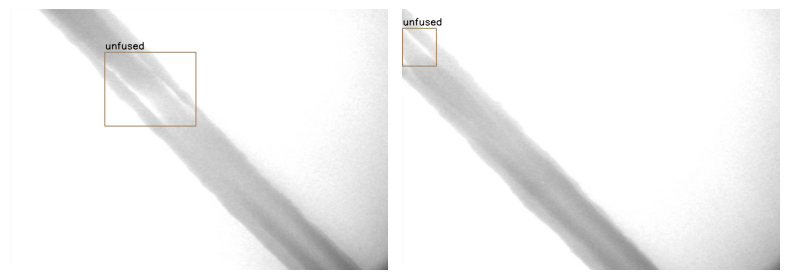

In [ ]:
plot(
    image_paths='train/images/img_unfused/*',
    label_paths='train/labels/txt_unfused/*',
    num_samples=2,
)

## 1.1. before Yolo

In [ ]:
!mv /content/val/images/img_air-hole/* /content/val/images
!mv /content/val/images/img_bite-edge/* /content/val/images
!mv /content/val/images/img_broken-arc/* /content/val/images
!mv /content/val/images/img_crack/* /content/val/images
!mv /content/val/images/img_overlap/* /content/val/images
!mv /content/val/images/img_unfused/* /content/val/images

!mv /content/val/labels/txt_air-hole/* /content/val/labels
!mv /content/val/labels/txt_bite-edge/* /content/val/labels
!mv /content/val/labels/txt_broken-arc/* /content/val/labels
!mv /content/val/labels/txt_crack/* /content/val/labels
!mv /content/val/labels/txt_overlap/* /content/val/labels
!mv /content/val/labels/txt_unfused/* /content/val/labels

!mv /content/train/images/img_air-hole/* /content/train/images
!mv /content/train/images/img_bite-edge/* /content/train/images
!mv /content/train/images/img_broken-arc/* /content/train/images
!mv /content/train/images/img_crack/* /content/train/images
!mv /content/train/images/img_overlap/* /content/train/images
!mv /content/train/images/img_unfused/* /content/train/images

!mv /content/train/labels/txt_air-hole/* /content/train/labels
!mv /content/train/labels/txt_bite-edge/* /content/train/labels
!mv /content/train/labels/txt_broken-arc/* /content/train/labels
!mv /content/train/labels/txt_crack/* /content/train/labels
!mv /content/train/labels/txt_overlap/* /content/train/labels
!mv /content/train/labels/txt_unfused/* /content/train/labels

!rm -rf /content/val/images/img_air-hole
!rm -rf /content/val/images/img_bite-edge
!rm -rf /content/val/images/img_broken-arc
!rm -rf /content/val/images/img_crack
!rm -rf /content/val/images/img_overlap
!rm -rf /content/val/images/img_unfused

!rm -rf /content/val/labels/txt_air-hole
!rm -rf /content/val/labels/txt_bite-edge
!rm -rf /content/val/labels/txt_broken-arc
!rm -rf /content/val/labels/txt_crack
!rm -rf /content/val/labels/txt_overlap
!rm -rf /content/val/labels/txt_unfused

!rm -rf /content/train/images/img_air-hole
!rm -rf /content/train/images/img_bite-edge
!rm -rf /content/train/images/img_broken-arc
!rm -rf /content/train/images/img_crack
!rm -rf /content/train/images/img_overlap
!rm -rf /content/train/images/img_unfused

!rm -rf /content/train/labels/txt_air-hole
!rm -rf /content/train/labels/txt_bite-edge
!rm -rf /content/train/labels/txt_broken-arc
!rm -rf /content/train/labels/txt_crack
!rm -rf /content/train/labels/txt_overlap
!rm -rf /content/train/labels/txt_unfused

In [ ]:
!zip -r /content/val.zip /content/val/*
!zip -r /content/train.zip /content/train/*

  adding: content/val/images/ (stored 0%)
  adding: content/val/images/air-hole10-056.jpg (deflated 0%)
  adding: content/val/images/air-hole10-088.jpg (deflated 0%)
  adding: content/val/images/air-hole10-008.jpg (deflated 0%)
  adding: content/val/images/broken-arc2-133.jpg (deflated 3%)
  adding: content/val/images/unfused2-12.jpg (deflated 0%)
  adding: content/val/images/air-hole4(hollow-bead)-260.jpg (deflated 0%)
  adding: content/val/images/air-hole12(hollow-bead)-150.jpg (deflated 2%)
  adding: content/val/images/air-hole11-031.jpg (deflated 6%)
  adding: content/val/images/air-hole11-063.jpg (deflated 2%)
  adding: content/val/images/air-hole10-024.jpg (deflated 0%)
  adding: content/val/images/overlap203.jpg (deflated 3%)
  adding: content/val/images/air-hole4(hollow-bead)-196.jpg (deflated 0%)
  adding: content/val/images/air-hole14-033.jpg (deflated 2%)
  adding: content/val/images/unfused46.jpg (deflated 4%)
  adding: content/val/images/unfused3-71.jpg (deflated 13%)
  ad

In [ ]:
#  один раз уже записал
# !cp /content/val.zip /content/drive/MyDrive/ВКР/Dataset_MD_train_val
# !cp /content/train.zip /content/drive/MyDrive/ВКР/Dataset_MD_train_val

# 2. YoloV5

## 1.1. Pepsi generation

In [ ]:
!pwd

In [ ]:
# можно начать сразу тут (либо до комментить до setup)

In [ ]:
import os
import shutil
import zipfile
import glob
import json
import numpy as np
import random
import cv2
import time

from PIL import Image
import matplotlib.pyplot as plt

import torch

from google.colab import drive
drive.mount('/content/drive')

from google.colab import files # для скачивания файлов

!sudo apt install tree

Mounted at /content/drive
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following NEW packages will be installed:
  tree
0 upgraded, 1 newly installed, 0 to remove and 45 not upgraded.
Need to get 47.9 kB of archives.
After this operation, 116 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tree amd64 2.0.2-1 [47.9 kB]
Fetched 47.9 kB in 1s (47.8 kB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debconf/FrontEnd/Dialog.pm line 78, <> line 1.)
debconf: falling back to frontend: Readline
debconf: unable to initialize frontend: Readline
debconf: (This frontend requires a controlling tty.)
debconf: falling back to frontend: Teletype
dpkg-preconfigure: unable to re-open stdin: 
Selecting previously unselected package tree.
(Reading database ... 121913 files and di

In [ ]:
! gdown --id 1-0hHhq-6Vth_HtHw6nLgfyvfjz8Imthw # train.zip
! gdown --id 1ozZ2IQvFVNhSGIwr-BZNK65NgYEXOs-z # val.zip

/usr/local/lib/python3.10/dist-packages/gdown/__main__.py:132: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From (original): https://drive.google.com/uc?id=1-0hHhq-6Vth_HtHw6nLgfyvfjz8Imthw
From (redirected): https://drive.google.com/uc?id=1-0hHhq-6Vth_HtHw6nLgfyvfjz8Imthw&confirm=t&uuid=27592679-dab2-479a-b834-498fa0d8d7d9
To: /content/train.zip
100% 168M/168M [00:05<00:00, 28.2MB/s]
/usr/local/lib/python3.10/dist-packages/gdown/__main__.py:132: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=1ozZ2IQvFVNhSGIwr-BZNK65NgYEXOs-z
To: /content/val.zip
100% 24.1M/24.1M [00:00<00:00, 34.7MB/s]


In [ ]:
!ls -lh /content/train.zip
!ls -lh /content/val.zip

-rw-r--r-- 1 root root 161M Jun  8 18:54 /content/train.zip
-rw-r--r-- 1 root root 23M Jun  8 18:54 /content/val.zip


In [ ]:
zip_f = zipfile.ZipFile('val.zip','r')
zip_f.extractall(path='/content/val')

zip_f = zipfile.ZipFile('train.zip','r')
zip_f.extractall(path='/content/train')

In [ ]:
!mv /content/val/content/val/images* /content/val
!mv /content/val/content/val/labels* /content/val
!rm -rf /content/val/content

!mv /content/train/content/train/images* /content/train
!mv /content/train/content/train/labels* /content/train
!rm -rf /content/train/content

!rm -rf /content/train.zip
!rm -rf /content/val.zip

In [ ]:
%cd /content/train
!find -type f | wc -l
%cd /content/val
!find -type f | wc -l

/content/train
2856
/content/val
408


## 1.1. YoloV5 (setup)

In [ ]:
%cd /content

/content


In [ ]:
data_yaml_path = os.path.join('/content/','data.yaml' )

string = \
'''
train: /content/train/images
val: /content/val/images

# number of classes
nc: 6

# class names
names: ['air-hole', 'bite-edge', 'broken-arc', 'crack', 'overlap', 'unfused']
'''
with open(data_yaml_path,'w') as f:
  f.writelines(string)
  f.close()

with open(data_yaml_path, 'r') as fin:
    data = fin.read().splitlines(True)
with open(data_yaml_path, 'w') as fout:
    fout.writelines(data[1:])

In [ ]:
if not os.path.exists('yolov5'):
  !git clone https://github.com/ultralytics/yolov5.git

Cloning into 'yolov5'...
remote: Enumerating objects: 16656, done.
remote: Counting objects: 100% (7/7), done.
remote: Compressing objects: 100% (7/7), done.
remote: Total 16656 (delta 1), reused 5 (delta 0), pack-reused 16649
Receiving objects: 100% (16656/16656), 15.14 MiB | 2.76 MiB/s, done.
Resolving deltas: 100% (11441/11441), done.


In [ ]:
# Load a model (yolov5)
%cd /content/yolov5/
model = torch.hub.load('ultralytics/yolov5', 'yolov5s', pretrained=True, trust_repo=True)
model = torch.hub.load('ultralytics/yolov5', 'yolov5m', pretrained=True, trust_repo=True)
model = torch.hub.load('ultralytics/yolov5', 'yolov5l', pretrained=True, trust_repo=True)
model = torch.hub.load('ultralytics/yolov5', 'yolov5x', pretrained=True, trust_repo=True)

/content/yolov5


Downloading: "https://github.com/ultralytics/yolov5/zipball/master" to /root/.cache/torch/hub/master.zip


requirements: Ultralytics requirements ['gitpython>=3.1.30', 'pillow>=10.3.0', 'requests>=2.32.0'] not found, attempting AutoUpdate...
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 8.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 51.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.9/64.9 kB 189.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 170.5 MB/s eta 0:00:00
  Attempting uninstall: requests
    Found existing installation: requests 2.31.0
    Uninstalling requests-2.31.0:
      Successfully uninstalled requests-2.31.0
  Attempting uninstall: pillow
    Found existing installation: Pillow 9.4.0
    Uninstalling Pillow-9.4.0:
      Successfully uninstalled Pillow-9.4.0

requirements: AutoUpdate success ✅ 8.7s, installed 3 packages: ['gitpython>=3.1.30', 'pillow>=10.3.0', 'requests>=2.32.0']
requirements: ⚠️ Restart runtime or rerun command for updates to take effect



YOLOv5 🚀 2024-6-8 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

100%|██████████| 14.1M/14.1M [00:00<00:00, 430MB/s]

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 
Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-6-8 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

100%|██████████| 40.8M/40.8M [00:00<00:00, 486MB/s]

Fusing layers... 
YOLOv5m summary: 290 layers, 21172173 parameters, 0 gradients, 48.9 GFLOPs
Adding AutoShape... 
Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-6-8 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

100%|██████████| 89.3M/89.3M [00:00<00:00, 110MB/s]

Fusing layers... 
YOLOv5l summary: 367 layers, 46533693 parameters, 0 gradients, 109.0 GFLOPs
Adding AutoShape... 
Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-6-8 Python-3.10.12 torch-2.3.0+cu12

In [ ]:
%pip install -qr requirements.txt

## 1.1. YoloV5 (train)

In [ ]:
%cd /content/yolov5

/content/yolov5


In [ ]:
TRAIN = True
EPOCHS = 40
YoloV = 'v5s'

In [ ]:
# !rm -rf /content/yolov5/runs

In [ ]:
start_time = time.time()

RES_DIR = set_res_dir()
if TRAIN:
    !python train.py \
    --data ../data.yaml \
    --weights yolo{YoloV}.pt \
    --img 640 \
    --epochs {EPOCHS} \
    --batch-size 16 \
    --name {RES_DIR}

    detect_time = time.time() - start_time

Current number of result directories: 0
results_1
2024-06-08 19:02:57.403461: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-08 19:02:57.403512: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-08 19:02:57.517620: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5s.pt, cfg=, data=../data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=40, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=None, image_weights=False

In [ ]:
print('время обучения модели', YoloV, '=', round(detect_time/60,0), '[мин]')

время обучения модели v5s = 67.0 [мин]


In [ ]:
!zip -r /content/yolov5/runs_{YoloV}.zip /content/yolov5/runs/train/results_1/*

  adding: content/yolov5/runs/train/results_1/confusion_matrix.png (deflated 26%)
  adding: content/yolov5/runs/train/results_1/events.out.tfevents.1717873382.dbcca45a13e8.3591.0 (deflated 28%)
  adding: content/yolov5/runs/train/results_1/F1_curve.png (deflated 7%)
  adding: content/yolov5/runs/train/results_1/hyp.yaml (deflated 45%)
  adding: content/yolov5/runs/train/results_1/labels_correlogram.jpg (deflated 45%)
  adding: content/yolov5/runs/train/results_1/labels.jpg (deflated 29%)
  adding: content/yolov5/runs/train/results_1/opt.yaml (deflated 50%)
  adding: content/yolov5/runs/train/results_1/P_curve.png (deflated 10%)
  adding: content/yolov5/runs/train/results_1/PR_curve.png (deflated 19%)
  adding: content/yolov5/runs/train/results_1/R_curve.png (deflated 9%)
  adding: content/yolov5/runs/train/results_1/results.csv (deflated 82%)
  adding: content/yolov5/runs/train/results_1/results.png (deflated 8%)
  adding: content/yolov5/runs/train/results_1/train_batch0.jpg (deflated 

In [ ]:
!cp /content/yolov5/runs_{YoloV}.zip /content/drive/MyDrive/ВКР/Dataset_MD_train_val

In [ ]:
# ------------------------------------------------- #

In [ ]:
# !rm -rf /content/yolov5/runs

In [ ]:
TRAIN = True
EPOCHS = 40
YoloV = 'v5m'

In [ ]:
start_time = time.time()

RES_DIR = set_res_dir()
if TRAIN:
    !python train.py \
    --data ../data.yaml \
    --weights yolo{YoloV}.pt \
    --img 640 \
    --epochs {EPOCHS} \
    --batch-size 16 \
    --name {RES_DIR}

    detect_time = time.time() - start_time

Current number of result directories: 1
results_2
2024-06-08 20:16:12.349967: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-08 20:16:12.350032: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-08 20:16:12.352284: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5m.pt, cfg=, data=../data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=40, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=None, image_weights=False

In [ ]:
print('время обучения модели', YoloV, '=', round(detect_time/60,0), '[мин]')

In [ ]:
# !!!
!zip -r /content/yolov5/runs_{YoloV}.zip /content/yolov5/runs/train/results_2/*

In [ ]:
!cp /content/yolov5/runs_{YoloV}.zip /content/drive/MyDrive/ВКР/Dataset_MD_train_val

# 1.* Cоздание видео и скачивание (выполнять не обязательно)

In [ ]:
# https://www.geeksforgeeks.org/python-create-video-using-multiple-images-using-opencv/

In [ ]:
# путь ml или vkr

# Video Generating function
def generate_video(image_folder, video_name):
    # image_folder = '.' # make sure to use your folder
    # video_name = 'mygeneratedvideo.avi'
    os.chdir("/content/ml/video")

    images = [img for img in os.listdir(image_folder)
              if img.endswith(".jpg") or
                 img.endswith(".jpeg") or
                 img.endswith("png")]
    images.sort()
    # Array images should only consider
    # the image files ignoring others if any
    print(images)

    frame = cv2.imread(os.path.join(image_folder, images[0]))

    # setting the frame width, height width
    # the width, height of first image
    height, width, layers = frame.shape

    video = cv2.VideoWriter(video_name, 0, 5, (width, height))

    # Appending the images to the video one by one
    for image in images:
        video.write(cv2.imread(os.path.join(image_folder, image)))

    # Deallocating memories taken for window creation
    cv2.destroyAllWindows()
    video.release()  # releasing the video generated

In [ ]:
import cv2
from PIL import Image

In [ ]:
for j in img_list:
  # Folder which contains all the images from which video is to be generated
  path = j
  os.chdir(path)

  mean_height = 0
  mean_width = 0

  num_of_images = len(os.listdir('.'))

  for file in os.listdir('.'):
      im = Image.open(os.path.join(path, file))
      width, height = im.size
      mean_width += width
      mean_height += height
      # im.show()   # uncomment this for displaying the image

  # Finding the mean height and width of all images.
  # This is required because the video frame needs
  # to be set with same width and height. Otherwise
  # images not equal to that width height will not get
  # embedded into the video
  mean_width = int(mean_width / num_of_images)
  mean_height = int(mean_height / num_of_images)

  # print(mean_height)
  # print(mean_width)

  # Resizing of the images to give them same width and height
  for file in os.listdir('.'):
      if file.endswith(".jpg") or file.endswith(".jpeg") or file.endswith("png"):
          # opening image using PIL Image
          im = Image.open(os.path.join(path, file))

          # im.size includes the height and width of image
          width, height = im.size
          '''Чурилов закомментил:''' # print(width, height)

          # resizing
          imResize = im.resize((mean_width, mean_height), Image.ANTIALIAS)
          imResize.save( file, 'JPEG', quality = 95) # setting quality
          # printing each resized image name
          '''Чурилов закомментил:''' # print(im.filename.split('\\')[-1], " is resized")

<ipython-input-25-94a04a73effc>:40: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  imResize = im.resize((mean_width, mean_height), Image.ANTIALIAS)


In [ ]:
for i in img_list:
  # Calling the generate_video function (# дооолго #)
  image_folder = i
  video_name = i.split('/')[-1] + '.avi'
  generate_video(image_folder, video_name)

['air-hole1-13.jpg', 'air-hole1-14.jpg', 'air-hole1-15.jpg', 'air-hole1-16.jpg', 'air-hole1-17.jpg', 'air-hole1-18.jpg', 'air-hole1-19.jpg', 'air-hole1-20.jpg', 'air-hole1-21.jpg', 'air-hole1-22.jpg', 'air-hole1-23.jpg', 'air-hole1-24.jpg', 'air-hole1-25.jpg', 'air-hole1-26.jpg', 'air-hole1-27.jpg', 'air-hole1-28.jpg', 'air-hole1-29.jpg', 'air-hole1-30.jpg', 'air-hole1-31.jpg', 'air-hole1-32.jpg', 'air-hole1-33.jpg', 'air-hole1-34.jpg', 'air-hole1-35.jpg', 'air-hole1-36.jpg', 'air-hole1-37.jpg', 'air-hole1-38.jpg', 'air-hole1-39.jpg', 'air-hole1-40.jpg', 'air-hole1-41.jpg', 'air-hole1-42.jpg', 'air-hole1-43.jpg', 'air-hole1-44.jpg']
['air-hole10-000.jpg', 'air-hole10-001.jpg', 'air-hole10-002.jpg', 'air-hole10-003.jpg', 'air-hole10-004.jpg', 'air-hole10-005.jpg', 'air-hole10-006.jpg', 'air-hole10-007.jpg', 'air-hole10-008.jpg', 'air-hole10-009.jpg', 'air-hole10-010.jpg', 'air-hole10-011.jpg', 'air-hole10-012.jpg', 'air-hole10-013.jpg', 'air-hole10-014.jpg', 'air-hole10-015.jpg', 'air-h

In [ ]:
%cd /content

/content


In [ ]:
path = '/content/vkr/video'
!du -sh {path}

4.1G	/content/vkr/video


In [ ]:
%cd {path}

/content/vkr/video


In [ ]:
# !rm -rf /content/.ipynb_checkpoints

In [ ]:
# создал список с путями к видео файлам
list_avi = []
for i in os.listdir():
  list_avi.append(i)
  list_avi.sort()
print(*list_avi, sep = "\n")
print('\n','count of avi = ', len(list_avi), sep = '')

img_air-hole_part_1.avi
img_air-hole_part_10.avi
img_air-hole_part_11.avi
img_air-hole_part_12.avi
img_air-hole_part_13.avi
img_air-hole_part_14.avi
img_air-hole_part_15.avi
img_air-hole_part_2.avi
img_air-hole_part_3.avi
img_air-hole_part_4.avi
img_air-hole_part_7.avi
img_bite-edge_part_2.avi
img_broken-arc_part_1.avi
img_broken-arc_part_2.avi
img_broken-arc_part_3.avi
img_crack.avi
img_overlap.avi
img_unfused_part_1.avi
img_unfused_part_2.avi
img_unfused_part_3.avi
img_unfused_part_4.avi
img_unfused_part_5.avi
img_unfused_part_6.avi

count of avi = 23


In [ ]:
%cd /content/vkr/video

/content/vkr/video


In [ ]:
# создал архивы с видео, чтобы легче скачать
for i in list_avi:
  new_zip_file = '/content/vkr/video_zip/' + i.split('.')[0] + '.zip'
  !zip -r {new_zip_file} {i}

  adding: img_air-hole_part_1.avi (deflated 75%)
  adding: img_air-hole_part_10.avi (deflated 73%)
  adding: img_air-hole_part_11.avi (deflated 80%)
  adding: img_air-hole_part_12.avi (deflated 77%)
  adding: img_air-hole_part_13.avi (deflated 75%)
  adding: img_air-hole_part_14.avi (deflated 77%)
  adding: img_air-hole_part_15.avi (deflated 76%)
  adding: img_air-hole_part_2.avi (deflated 74%)
  adding: img_air-hole_part_3.avi (deflated 71%)
  adding: img_air-hole_part_4.avi (deflated 72%)
  adding: img_air-hole_part_7.avi (deflated 73%)
  adding: img_bite-edge_part_2.avi (deflated 77%)
  adding: img_broken-arc_part_1.avi (deflated 75%)
  adding: img_broken-arc_part_2.avi (deflated 72%)
  adding: img_broken-arc_part_3.avi (deflated 87%)
  adding: img_crack.avi (deflated 71%)
  adding: img_overlap.avi (deflated 74%)
  adding: img_unfused_part_1.avi (deflated 76%)
  adding: img_unfused_part_2.avi (deflated 72%)
  adding: img_unfused_part_3.avi (deflated 87%)
  adding: img_unfused_part_4

In [ ]:
path = '/content/vkr/video_zip'
!du -sh {path}

973M	/content/vkr/video_zip


In [ ]:
%cd '/content/vkr/video_zip'

/content/vkr/video_zip


In [ ]:
os.listdir()

['img_unfused_part_6.zip',
 'img_air-hole_part_12.zip',
 'img_unfused_part_1.zip',
 'img_air-hole_part_4.zip',
 'img_unfused_part_3.zip',
 'img_broken-arc_part_3.zip',
 'img_overlap.zip',
 'img_crack.zip',
 'img_unfused_part_4.zip',
 'img_air-hole_part_11.zip',
 'img_air-hole_part_13.zip',
 'img_broken-arc_part_1.zip',
 'img_unfused_part_2.zip',
 'img_air-hole_part_15.zip',
 'img_air-hole_part_3.zip',
 'img_air-hole_part_7.zip',
 'img_air-hole_part_2.zip',
 'img_unfused_part_5.zip',
 'img_bite-edge_part_2.zip',
 'img_air-hole_part_14.zip',
 'img_air-hole_part_10.zip',
 'img_broken-arc_part_2.zip',
 'img_air-hole_part_1.zip']

In [ ]:
# скачивание данных (# дооолго #)
# for i in os.listdir()[:11]:
#   files.download(i)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# скачивание данных (# дооолго #)
# for i in os.listdir()[11:]:
#   files.download(i)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# 2. ML

## 2.1. YOLO

### 2.1. база

In [ ]:
import os
from PIL import Image
import matplotlib.pyplot as plt

import torch

In [ ]:
os.mkdir('/content/test/')
os.mkdir('/content/pictures/')

In [ ]:
def torch_stats():
    torch_version = ".".join(torch.__version__.split(".")[:2])
    print('PyTorch version:',torch_version)

    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    print('Using device:', device)
    dtype = torch.float32

    if device.type == 'cuda':
        cuda_version  = torch.__version__.split("+")[-1]
        print("Cuda: ", cuda_version)

        torch.set_default_tensor_type(torch.cuda.FloatTensor)
        print('Cuda is available:',torch.cuda.is_available())

        n_devices = torch.cuda.device_count()
        print('number of devices: %d'%(n_devices))

        for cnt_device in range(n_devices):
            print(torch.cuda.get_device_name(cnt_device))
            print('Memory Usage:')
            print('Allocated:', round(torch.cuda.memory_allocated(cnt_device)/1024**3,1), 'GB')
            print('Cached:   ', round(torch.cuda.memory_reserved(cnt_device)/1024**3,1), 'GB')

    torch.set_default_dtype(dtype) # float32
    print('Default data type:',dtype)

    num_workers=os.cpu_count() #torch.get_num_threads()
    print ('Available number of workers:',num_workers)

    return device, dtype, num_workers
#-------------------------------
def torch_seed(seed = 42, deterministic = True):
    random.seed(seed)                                 # random and transforms
    np.random.seed(seed)                              # numpy
    torch.manual_seed(seed)                           # cpu
    torch.cuda.manual_seed(seed)                      # gpu
    torch.backends.cudnn.deterministic=deterministic  #cudnn

### 2.1. тест Image.open

In [ ]:
# удалил папки с видео (чтобы не мешалось...)
!rm -rf /content/vkr/video*
!rm -rf /content/vkr/video_zip*

In [ ]:
test1 = 'bicycles.jpg'

In [ ]:
%cd /content

/content


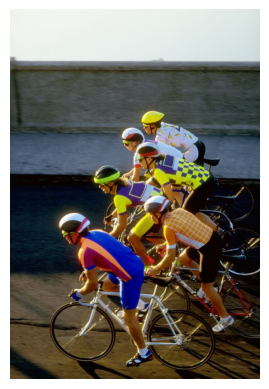

In [ ]:
# протестировал возможность отображения картинки (были проблемы...)
url = 'https://dasart.ru/userdata/image/7c/41/7c410600c34b04aad750a1a6fcc4d4ff.jpg'

image_file = '/content/test/' + test1
!wget -q -O {image_file} {url}

plt.imshow(Image.open(image_file))
plt.axis('off')
plt.show()

In [ ]:
# загрузил красивую картинку yolomodels
image_file = '/content/pictures/YOLOv5models.jpg'
!wget --no-check-certificate \
'https://drive.google.com/uc?export=download&id=1ikikObeB5i-8f5vFJA1Zu1XqzTx_gZAh' -O {image_file}

--2024-05-21 20:45:01--  https://drive.google.com/uc?export=download&id=1ikikObeB5i-8f5vFJA1Zu1XqzTx_gZAh
Resolving drive.google.com (drive.google.com)... 173.194.79.139, 173.194.79.102, 173.194.79.113, ...
Connecting to drive.google.com (drive.google.com)|173.194.79.139|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://drive.usercontent.google.com/download?id=1ikikObeB5i-8f5vFJA1Zu1XqzTx_gZAh&export=download [following]
--2024-05-21 20:45:01--  https://drive.usercontent.google.com/download?id=1ikikObeB5i-8f5vFJA1Zu1XqzTx_gZAh&export=download
Resolving drive.usercontent.google.com (drive.usercontent.google.com)... 74.125.128.132, 2a00:1450:4013:c02::84
Connecting to drive.usercontent.google.com (drive.usercontent.google.com)|74.125.128.132|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 391931 (383K) [image/jpeg]
Saving to: ‘/content/pictures/YOLOv5models.jpg’

/content/pictures/Y 100%[===================>] 382.75K  --.

### 2.1. настройка YOLOv5

In [ ]:
%cd /content

/content


In [ ]:
# !rm -f /content/yolov5*

In [ ]:
!git clone https://github.com/ultralytics/yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 16625, done.
remote: Counting objects: 100% (103/103), done.
remote: Compressing objects: 100% (73/73), done.
remote: Total 16625 (delta 58), reused 65 (delta 30), pack-reused 16522
Receiving objects: 100% (16625/16625), 15.10 MiB | 18.97 MiB/s, done.
Resolving deltas: 100% (11417/11417), done.


In [ ]:
# Load a model (yolov5)
%cd /content/yolov5/
model = torch.hub.load('ultralytics/yolov5', 'yolov5s', pretrained=True, trust_repo=True)
model = torch.hub.load('ultralytics/yolov5', 'yolov5m', pretrained=True, trust_repo=True)
model = torch.hub.load('ultralytics/yolov5', 'yolov5l', pretrained=True, trust_repo=True)
model = torch.hub.load('ultralytics/yolov5', 'yolov5x', pretrained=True, trust_repo=True)

/content/yolov5


Downloading: "https://github.com/ultralytics/yolov5/zipball/master" to /root/.cache/torch/hub/master.zip


requirements: Ultralytics requirements ['gitpython>=3.1.30', 'pillow>=10.3.0', 'requests>=2.32.0'] not found, attempting AutoUpdate...
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 5.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 102.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.9/63.9 kB 182.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 199.8 MB/s eta 0:00:00
  Attempting uninstall: requests
    Found existing installation: requests 2.31.0
    Uninstalling requests-2.31.0:
      Successfully uninstalled requests-2.31.0
  Attempting uninstall: pillow
    Found existing installation: Pillow 9.4.0
    Uninstalling Pillow-9.4.0:
      Successfully uninstalled Pillow-9.4.0

requirements: AutoUpdate success ✅ 9.6s, installed 3 packages: ['gitpython>=3.1.30', 'pillow>=10.3.0', 'requests>=2.32.0']
requirements: ⚠️ Restart runtime or rerun command for updates to take effect



YOLOv5 🚀 2024-5-26 Python-3.10.12 torch-2.3.0+cu121 CPU

100%|██████████| 14.1M/14.1M [00:00<00:00, 125MB/s]

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 
Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-5-26 Python-3.10.12 torch-2.3.0+cu121 CPU

100%|██████████| 40.8M/40.8M [00:00<00:00, 136MB/s] 

Fusing layers... 
YOLOv5m summary: 290 layers, 21172173 parameters, 0 gradients, 48.9 GFLOPs
Adding AutoShape... 
Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-5-26 Python-3.10.12 torch-2.3.0+cu121 CPU

100%|██████████| 89.3M/89.3M [00:00<00:00, 222MB/s]

Fusing layers... 
YOLOv5l summary: 367 layers, 46533693 parameters, 0 gradients, 109.0 GFLOPs
Adding AutoShape... 
Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-5-26 Python-3.10.12 torch-2.3.0+cu121 CPU

100%|██████████| 166M/166M [00:00<00:00, 301MB/s]

Fusing la

In [ ]:
%cd /content/yolov5/
%pip install -qr requirements.txt

/content/yolov5


In [ ]:
import yolov5

In [ ]:
from yolov5 import utils
display = utils.notebook_init()

YOLOv5 🚀 2024-5-21 Python-3.10.12 torch-2.3.0+cu121 CPU


Setup complete ✅ (2 CPUs, 12.7 GB RAM, 31.0/107.7 GB disk)


In [ ]:
import time

import random
import numpy as np

%matplotlib inline

import cv2
import matplotlib.patches as patches
from google.colab.patches import cv2_imshow

In [ ]:
torch.cuda.empty_cache()
device, dtype, num_workers = torch_stats()
torch_seed(seed = 42, deterministic = True)

PyTorch version: 2.3
Using device: cpu
Default data type: torch.float32
Available number of workers: 2


In [ ]:
import json

import pandas as pd
import seaborn as sns

### 2.1. проверка YOLOv5 (выполнять не обязательно)

In [ ]:
%cd /content/yolov5/

In [ ]:
img = '/content/test/' + test1
Image.open(img).size

In [ ]:
# отображение красивой картинки yolomodels
plt.figure(figsize=(10,6))
plt.imshow(Image.open(image_file))
plt.axis('off')
plt.show()

In [ ]:
# предсказание модели (CLI)
start_time = time.time()

!python detect.py \
--weights yolov5x.pt \
--img 640 \
--conf 0.3 \
--source '/content/test/' \
--exist-ok \
# --hide-labels

detect_time = time.time() - start_time

In [ ]:
print('время работы модели =' , round(detect_time,0), '[c]')
display.Image(filename='/content/yolov5/runs/detect/exp/'+ test1,
              width=400)

In [ ]:
# Результат экспериментов с yolov5
# модель      | layers | parameters | время | точность  | объектs
# yolov5s.pt  | 213    | 7225885    | 10    | 0.80      | 6
# yolov5m.pt  | 290    | 21172173   | 11    | 0.89      | 7
# yolov5l.pt  | 367    | 46533693   | 14    | 0.90      | 8
# yolov5x.pt  | 444    | 86705005   | 27    | 0.92      | 11

### 2.1. настройка YOLOv8

In [ ]:
%cd /content

/content


In [ ]:
!mkdir yolov8

In [ ]:
from ultralytics import YOLO

In [ ]:
# Load a model (yolov8)
%cd /content/yolov8
model_yolov8s = YOLO('yolov8s.pt')  # load an official model
model_yolov8m = YOLO('yolov8m.pt')  # load an official model
model_yolov8l = YOLO('yolov8l.pt')  # load an official model
model_yolov8x = YOLO('yolov8x.pt')  # load an official model

/content/yolov8


100%|██████████| 21.5M/21.5M [00:00<00:00, 53.4MB/s]


100%|██████████| 49.7M/49.7M [00:00<00:00, 355MB/s]


100%|██████████| 83.7M/83.7M [00:00<00:00, 301MB/s]


100%|██████████| 131M/131M [00:07<00:00, 18.0MB/s]


### 2.1. проверка YOLOv8 (выполнять не обязательно)

In [ ]:
# предсказание модели (SDK)
start_time = time.time()

model = model_yolov8m
model.predict('/content/test/',
              save=True,
              imgsz=640,
              conf=0.3,
              show_labels=False,
              exist_ok=True)

detect_time = time.time() - start_time

In [ ]:
print('время работы модели =' , round(detect_time,0), '[c]')
img = '/content/yolov8/runs/detect/predict/' + test1
plt.figure(figsize=(7,7))
plt.imshow(Image.open(img))
plt.axis('off')
plt.show()

In [ ]:
# предсказание модели (CLI)
path = '/content/test/'
start_time = time.time()

!yolo \
task=detect \
mode=predict \
model=yolov8m.pt \
imgsz=640 \
conf=0.3 \
source={path} \
exist_ok=False \
show_labels=False \
save=True

detect_time = time.time() - start_time

In [ ]:
print('время работы модели =' , round(detect_time,0), '[c]')
img = '/content/yolov8/runs/detect/predict2/' + test1
plt.figure(figsize=(7,7))
plt.imshow(Image.open(img))
plt.axis('off')
plt.show()

In [ ]:
# Результат экспериментов с yolov8
# модель      | layers | parameters | время | точность  | объектs
# yolov8s.pt  | -      | -          | 1     | 0.90      | 9
# yolov8m.pt  | -      | -          | 1     | 0.90      | 10
# yolov8l.pt  | -      | -          | 2     | 0.94      | 11
# yolov8x.pt  | -      | -          | 3     | 0.93      | 11

## 2.2. Визуализация

### 2.2. содержимое результатов НК (общее)



In [ ]:
""" принимает
    defect_num - тип дефекта
    sh = 1     - показывает barplot (default)
    sh = 0     - не показывает barplot
"""

''' возвращает
    mask
    list__jpg
    list__json
'''

def deffect(defect_num, sh = 1):
  # --------------------------------------------------------------------------- #
  # 1 - определил количество файлов; создал "маску"
  list_part = []
  list_count = []
  mask = list(defect_type.keys())[defect_num]

  # print(f"count of images for type of defect '{mask.replace('__','-')}'")
  for i in defect_type.get(mask):
    dir = ('/content/vkr/img/img_' + mask + '_part_' + str(i)).replace('__','-')
    list_dir = os.listdir(dir)

    list_part.append(dir[-2:].replace('_',''))
    list_count.append(len(list_dir))
    # print(f"part_{dir[-2:].replace('_','')} = {len(list_dir)}")
  # --------------------------------------------------------------------------- #
  df = pd.DataFrame(list(zip(list_part, list_count)),
                    columns =['Part', 'Count_of_file'])
  # --------------------------------------------------------------------------- #
  # 2 - создал списки jpg и json для удобства (двухуровневые)
  list__json = []
  list__jpg = []

  for i in defect_type.get(mask):
    list_json_ = []
    list_jpg_ = []

    dir_json = ('/content/vkr/json/json_' + mask + '_part_' + str(i)).replace('__','-')
    dir_img = ('/content/vkr/img/img_' + mask + '_part_' + str(i)).replace('__','-')

    json_pattern = os.path.join(dir_json, '*.json')
    jpg_pattern = os.path.join(dir_img, '*.jpg')

    file_list = glob.glob(json_pattern)
    for file in file_list:
      list_json_.append(file)

    file_list = glob.glob(jpg_pattern)
    for file in file_list:
      list_jpg_.append(file)

    list_json_.sort()
    list_jpg_.sort()

    list__json.append(list_json_)
    list__jpg.append(list_jpg_)
  # --------------------------------------------------------------------------- #
  # 3 - визуализировал количество файлов

  # b: blue
  # g: green
  # r: red
  # c: cyan
  # m: magenta
  # y: yellow
  # k: black
  # w: white

  if sh == 1:
    plt.figure(figsize=(4,2.5),
            facecolor='gray')
    list_color = ['b', 'g', 'r', 'c', 'm', 'y']
    sns.barplot(data=df, x="Part", y="Count_of_file", color=list_color[defect_num])
    plt.xlabel("номер подкаталога") # Part
    plt.ylabel("количество изображений") # Count_of_file
    plt.grid(axis='y', linestyle='--', color='black')
    plt.title(mask.replace('__','-'),
              color=list_color[defect_num],
              fontweight='bold')
    plt.show()
    print()
  else:
    print(mask)
  return mask, list__jpg, list__json

In [ ]:
%cd /content/vkr

/content/vkr


In [ ]:
!du -sh * # Disk Usage

381M	img
13M	json
4.0K	train
4.0K	val


In [ ]:
!ls /content/vkr/img

img_air-hole_part_1   img_air-hole_part_15  img_broken-arc_part_1  img_unfused_part_2
img_air-hole_part_10  img_air-hole_part_2   img_broken-arc_part_2  img_unfused_part_3
img_air-hole_part_11  img_air-hole_part_3   img_broken-arc_part_3  img_unfused_part_4
img_air-hole_part_12  img_air-hole_part_4   img_crack_part_1	   img_unfused_part_5
img_air-hole_part_13  img_air-hole_part_7   img_overlap_part_1	   img_unfused_part_6
img_air-hole_part_14  img_bite-edge_part_2  img_unfused_part_1


In [ ]:
# создал словарь для удобства
defect_type = {'air__hole':   [1,2,3,4,7,10,11,12,13,14,15],
               'bite__edge':  [2],
               'broken__arc': [1,2,3],
               'crack':       [1],
               'overlap':     [1],
               'unfused':     [1, 2, 3, 4, 5, 6]} # list(range(1,7))

for i in range(len(list(defect_type.keys()))):
  key = list(defect_type.keys())[i]
  count = len(defect_type.get(list(defect_type.keys())[i]))
  print(f"{key: <15}: {count}")

air__hole      : 11
bite__edge     : 1
broken__arc    : 3
crack          : 1
overlap        : 1
unfused        : 6


In [ ]:
# потестировал работу со словарем
print(defect_type.keys(), '\n')
print(list(defect_type.keys())[2], '\n')
print(defect_type.get(list(defect_type.keys())[2]))

dict_keys(['air__hole', 'bite__edge', 'broken__arc', 'crack', 'overlap', 'unfused']) 

broken__arc 

[1, 2, 3]


In [ ]:
list_labels = ['пористость',
               'подрез',
               'обрыв дуги',
               'трещина',
               'нарушение формы',
               'несплавление']

In [ ]:
# 0 - air__hole   - [1,2,3,4,7,10,11,12,13,14,15] пористость
# 1 - bite__edge  - [2]                           подрез
# 2 - broken__arc - [1,2,3]                       обрыв дуги
# 3 - crack       - [1]                           трещина
# 4 - overlap     - [1]                           нарушение формы СШ
# 5 - unfused     - [1, 2, 3, 4, 5, 6]            несплавление

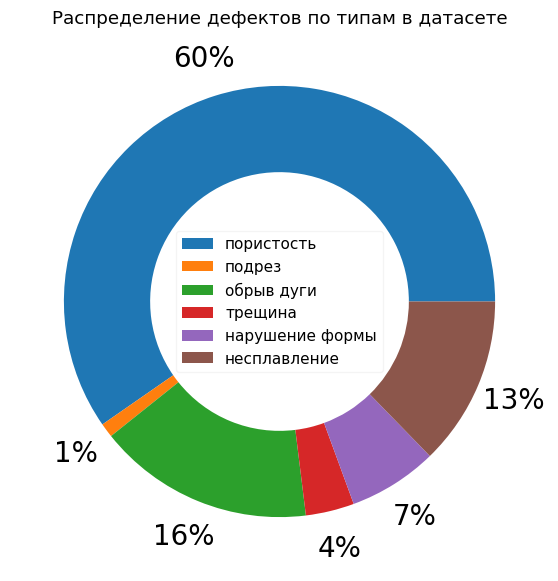

In [ ]:
# создал список с количеством каждого типа дефекта
list_tc = []
list_tc.append(sum(list_count[0:11]))
list_tc.append(sum(list_count[11:12]))
list_tc.append(sum(list_count[12:15]))
list_tc.append(sum(list_count[15:16]))
list_tc.append(sum(list_count[16:17]))
list_tc.append(sum(list_count[17:23]))

# создал список с лейблом каждого типа дефекта
list_lb = []
for i in list(defect_type.keys()):
  list_lb.append(i.replace('__','-'))

plt.figure(figsize=(7,7),
           facecolor='white')
plt.pie(list_tc,
        autopct='%1.0f%%',
        pctdistance=1.18,
        wedgeprops=dict(width=0.4),
        textprops={'fontsize': 20}
        )
plt.legend(loc='center',
           labels=list_labels,
           framealpha=0.2)
plt.title("Распределение дефектов по типам в датасете")
plt.show()

In [ ]:
list_tc # количество изображений

[1952, 35, 531, 119, 219, 416]

In [ ]:
count_of_img = 0
for i in list_tc:
  count_of_img += i
count_of_img

3272

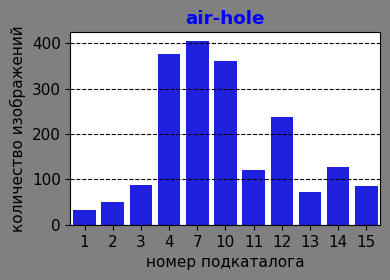

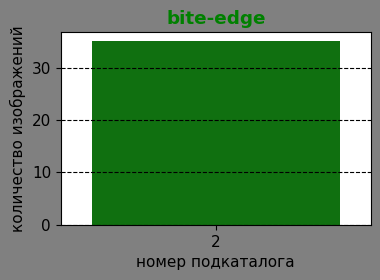

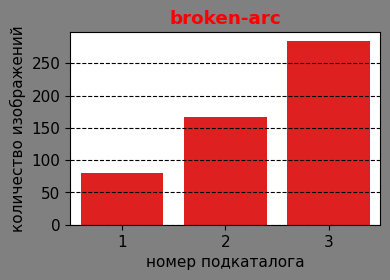

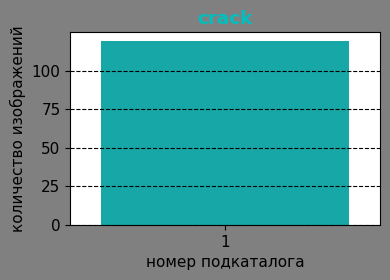

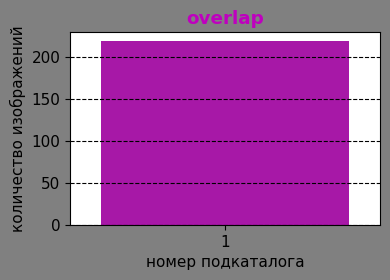

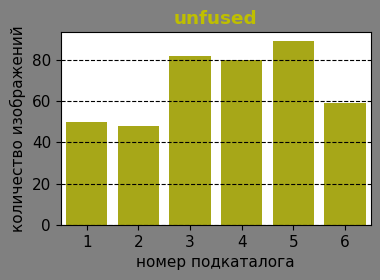

In [ ]:
# визуализировал все данные
for i in range(6):
  deffect(i)

In [ ]:
import re

# переименовал path в файлах json (везде)

for i in range(6):
  mask, list_jpg, list_json = deffect(i,0)

  for part in list_json:
    for file_ in part:
      with open(file_, 'r') as f:
        data = json.load(f)
      path_tsch = data['path']
      path_tsch = re.split(r'[/\\]', path_tsch)[-1]
      data['path'] = './' + data['path'].replace(data['path'], path_tsch)
      with open(file_, 'w') as f:
        json.dump(data, f, ensure_ascii=False, indent=2)

air__hole
bite__edge
broken__arc
crack
overlap
unfused


### 2.2. содержимое результатов НК (частное) выбор дефекта

In [ ]:
# определил тип дефекта, с которым далее буду работать
# 0 - air__hole   - [1,2,3,4,7,10,11,12,13,14,15] пористость      blue    0,128,255
# 1 - bite__edge  - [2]                           подрез          orange  255,128,0
# 2 - broken__arc - [1,2,3]                       обрыв дуги      green   0,128,0
# 3 - crack       - [1]                           трещина         red     255,0,0
# 4 - overlap     - [1]                           нарушение формы purple  128,0,255
# 5 - unfused     - [1, 2, 3, 4, 5, 6]            несплавление    brown   128,60,0
mask, list_jpg, list_json = deffect(5,0)

unfused


In [ ]:
# проредил air-hole, чтобы быстрее обучить
if mask == 'air__hole':
  for i in list_jpg[3][::2]:
    os.remove(os.path.join(i))
  for i in list_json[3][::2]:
    os.remove(os.path.join(i))

  for i in list_jpg[4][::2]:
    os.remove(os.path.join(i))
  for i in list_json[4][::2]:
    os.remove(os.path.join(i))

  for i in list_jpg[5][::2]:
    os.remove(os.path.join(i))
  for i in list_json[5][::2]:
    os.remove(os.path.join(i))

  for i in list_jpg[7][::2]:
    os.remove(os.path.join(i))
  for i in list_json[7][::2]:
    os.remove(os.path.join(i))

  mask, list_jpg, list_json = deffect(0,0)

In [ ]:
# искал дефектные файлы json
'''search = []
for i in range(len(list_json)):
  for j in range(len(list_json[i])):
    with open(list_json[i][j], 'r') as json_file:
      data_js = json.load(json_file)
    # кол-во объектов
    lengh_ = len(data_js["outputs"]['object'])
    if lengh_ == 0:
      search.append(list_json[i][j])

search'''

'search = []\nfor i in range(len(list_json)):\n  for j in range(len(list_json[i])):\n    with open(list_json[i][j], \'r\') as json_file:\n      data_js = json.load(json_file)\n    # кол-во объектов\n    lengh_ = len(data_js["outputs"][\'object\'])\n    if lengh_ == 0:\n      search.append(list_json[i][j])\n\nsearch'

In [ ]:
# ПРОВЕРКА

jp = 0
for i in range(len(list_jpg)): jp += len(list_jpg[i])
js = 0
for i in range(len(list_json)): js += len(list_json[i])

print('number of jpg =', jp, 'with', mask.replace('__','-'))
print('number of json =', js, 'with', mask.replace('__','-'))

middle = int(len(list_jpg)/2)

print(list_jpg[middle][5:8])
print(list_json[middle][5:8])

number of jpg = 408 with unfused
number of json = 408 with unfused
['/content/vkr/img/img_unfused_part_4/unfused4-05.jpg', '/content/vkr/img/img_unfused_part_4/unfused4-06.jpg', '/content/vkr/img/img_unfused_part_4/unfused4-07.jpg']
['/content/vkr/json/json_unfused_part_4/unfused4-05.json', '/content/vkr/json/json_unfused_part_4/unfused4-06.json', '/content/vkr/json/json_unfused_part_4/unfused4-07.json']


In [ ]:
c_blue    = (0,128,255) # air__hole
c_orange  = (255,128,0) # bite__edge
c_green   = (0,128,0)   # broken__arc
c_red     = (255,0,0)   # crack
c_purple  = (128,0,255) # overlap
c_brown   = (128,60,0)  # unfused
c_black   = (0,0,0)

In [ ]:
# 0 - air__hole   - [1,2,3,4,7,10,11,12,13,14,15] пористость      blue    0,128,255
# 1 - bite__edge  - [2]                           подрез          orange  255,128,0
# 2 - broken__arc - [1,2,3]                       обрыв дуги      green   0,128,0
# 3 - crack       - [1]                           трещина         red     255,0,0
# 4 - overlap     - [1]                           нарушение формы purple  128,0,255
# 5 - unfused     - [1, 2, 3, 4, 5, 6]            несплавление    brown   128,60,0

In [ ]:
if mask == 'air__hole':
  string = 331
  parts = 9
  colorRA = c_blue
elif mask == 'bite__edge':
  string = 111
  parts = 1
  colorRA = c_orange
elif mask == 'broken__arc':
  string = 131
  parts = 3
  colorRA = c_green
elif mask == 'crack':
  string = 111
  parts = 1
  colorRA = c_red
elif mask == 'overlap':
  string = 111
  parts = 1
  colorRA = c_purple
elif mask == 'unfused':
  string = 231
  parts = 6
  colorRA = c_brown

In [ ]:
print('string =', string, '|', 'parts =', parts)

string = 231 | parts = 6


In [ ]:
!pwd

/content/vkr


In [ ]:
!rm -f /content/vkr/*

rm: cannot remove '/content/vkr/img': Is a directory
rm: cannot remove '/content/vkr/json': Is a directory
rm: cannot remove '/content/vkr/train': Is a directory
rm: cannot remove '/content/vkr/val': Is a directory


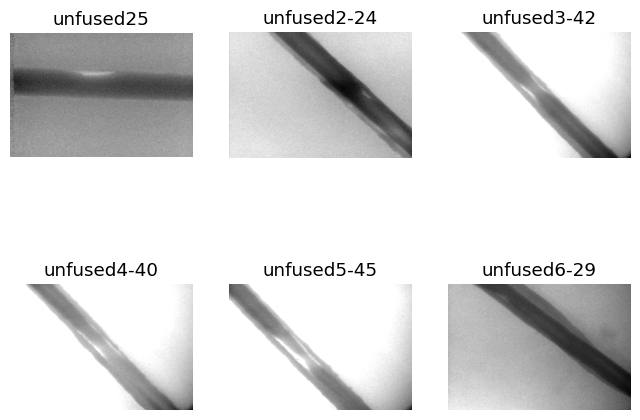

In [ ]:
# есть предобработка
plt.figure(figsize=(8, 6),
           facecolor='white')
string_ = string

for i in range(parts):
  j = int(len(list_jpg[i])/2)
  gray_img = cv2.cvtColor(cv2.imread(list_jpg[i][j]), cv2.COLOR_RGB2GRAY)
  # img = cv2.imread(list_jpg[i][j])
  plt.subplot(string_)
  string_ +=1
  plt.imshow(gray_img, cmap='gray')
  # plt.imshow(img)
  plt.title(list_json[i][j].split('/')[-1].replace('.json',''))

  plt.axis('off')
  plt.savefig(fname = '5d_1_kanal_')
  # plt.savefig(fname = '5d_3_kanal_')


In [ ]:
# настройка для выбора примеров
i = 1   # part    int(parts/2)
j = 20  # number  int(len(list_jpg[i])/2)

In [ ]:
%cd /content/test

/content/test


In [ ]:
# настройка для отображения примеров
if mask == 'air__hole':
  string = 331
  parts = 9
  colorRA = c_blue
elif mask == 'bite__edge':
  string = 111
  parts = 1
  colorRA = c_orange
elif mask == 'broken__arc':
  string = 131
  parts = 3
  colorRA = c_green
elif mask == 'crack':
  string = 111
  parts = 1
  colorRA = c_red
elif mask == 'overlap':
  string = 111
  parts = 1
  colorRA = c_purple
elif mask == 'unfused':
  string = 231
  parts = 6
  colorRA = c_brown

### 2.2. bouning box из json на jpg - single image (выполнять не обязательно)

In [ ]:
!rm -rf /content/test/*

In [ ]:
mask, list_jpg, list_json = deffect(2,0)

broken__arc


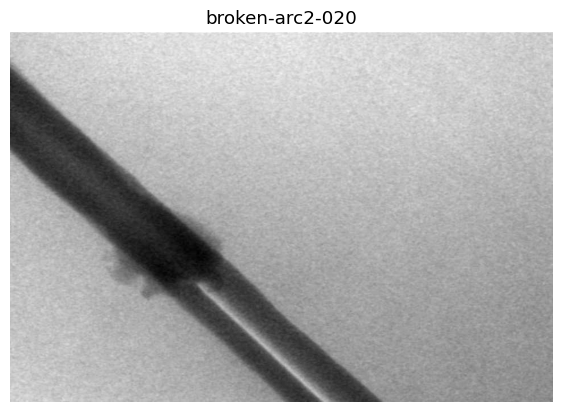

In [ ]:
# пример картинки (результат НК)
# img = cv2.imread(list_jpg[i][j])
img = cv2.cvtColor(cv2.imread(list_jpg[i][j]), cv2.COLOR_RGB2GRAY)

with open(list_json[i][j], 'r') as json_file:
    data_js = json.load(json_file)

plt.figure(figsize=(7, 7))
          #  facecolor='gray')
titl = data_js["path"].split('/')[-1].replace('.jpg','')
plt.title(titl)
# plt.imshow(img)
plt.imshow(img, cmap='gray')
plt.axis('off')
plt.savefig(fname = '14')

In [ ]:
data_js

{'path': './unfused3-76.jpg',
 'outputs': {'object': [{'name': 'unfused',
    'bndbox': {'xmin': 1055, 'ymin': 576, 'xmax': 1180, 'ymax': 714}}]},
 'time_labeled': 1615268407015,
 'labeled': True,
 'size': {'width': 1182, 'height': 818, 'depth': 3}}

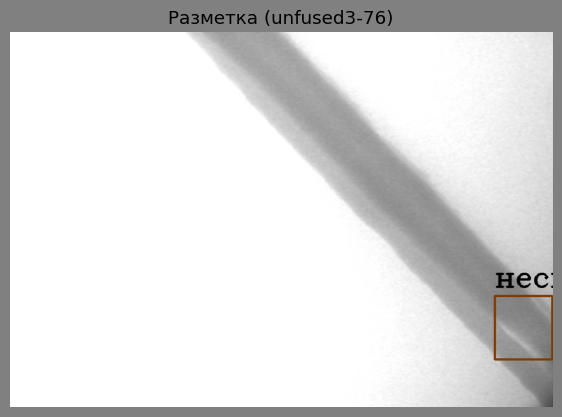

In [ ]:
# пример картинки с разметкой (результат НК)
plt.figure(figsize=(7, 7),
           facecolor='gray')
output = img.copy()
plt.axis('off')

lengh_ = len(data_js["outputs"]['object'])

tickness = 4
colorT = c_black
# параметры разметки
for i in range(lengh_):
  xmin = data_js["outputs"]['object'][i]['bndbox'].get('xmin')
  ymin = data_js["outputs"]['object'][i]['bndbox'].get('ymin')
  xmax = data_js["outputs"]['object'][i]['bndbox'].get('xmax')
  ymax = data_js["outputs"]['object'][i]['bndbox'].get('ymax')
  name = data_js["outputs"]['object'][i].get('name')

  if name == 'air-hole':
    name = 'пористость'
  elif name == 'bite-edge':
    name = 'подрез'
  elif name == 'broken-arc':
    name = 'обрыв дуги'
  elif name == 'crack':
    name = 'трещина'
  elif name == 'overlap':
    name = 'нарушение формы'
  elif name == 'unfused':
    name = 'несплавление'

  titl = 'Разметка (' + data_js["path"].split('/')[-1].replace('.jpg','') + ')'
  cv2.rectangle(output, (xmin,ymin), (xmax,ymax), colorRA, tickness)
  cv2.putText(output, name, (xmin, ymin-20), cv2.FONT_HERSHEY_COMPLEX, 2, colorT, tickness)
plt.title(titl)
plt.imshow(output)

### 2.2. bouning box из json на jpg - multiple images (выполнять не обязательно)

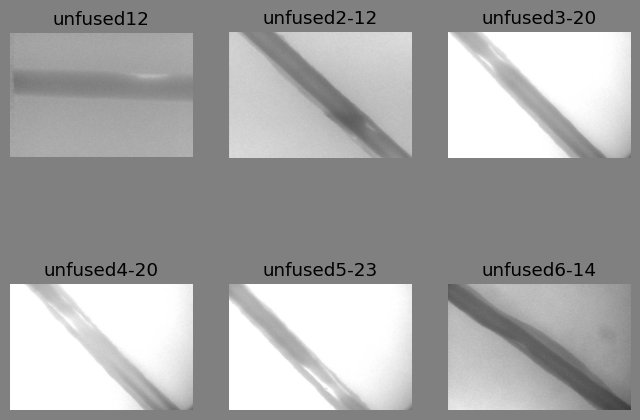

In [ ]:
plt.figure(figsize=(8, 6),
           facecolor='white')
string_ = string

for i in range(parts):
  j = int(len(list_jpg[i])/4)
  # gray_img = cv2.cvtColor(cv2.imread(list_jpg[i][j]), cv2.COLOR_RGB2GRAY)     # есть постобработка
  img = cv2.imread(list_jpg[i][j])                                              # нет постобработки
  plt.subplot(string_)
  string_ +=1
  # plt.imshow(gray_img, cmap='gray')
  plt.imshow(img)
  titl = list_json[i][j].split('/')[-1].replace('.json','')
  plt.title(titl)
  plt.axis('off')

In [ ]:
!pwd

/content/vkr


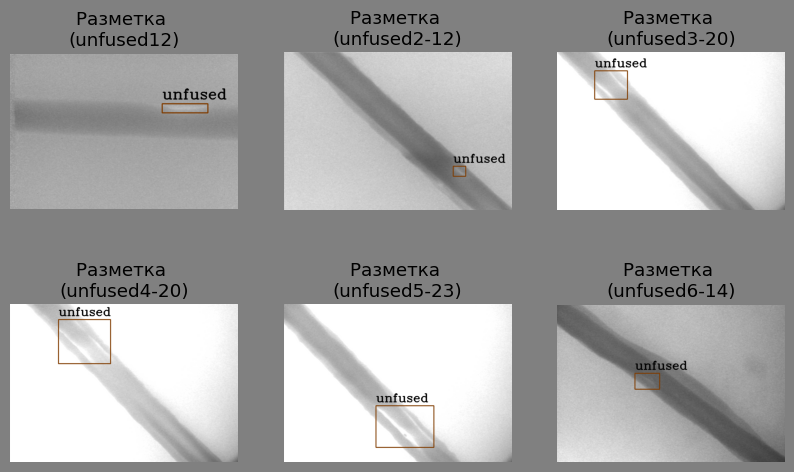

In [ ]:
plt.figure(figsize=(10, 6),
               facecolor='gray')
string_ = string

for i in range(parts):
  j = int(len(list_jpg[i])/4)
  # картинка
  img = cv2.imread(list_jpg[i][j])
  # файл разметки
  with open(list_json[i][j], 'r') as json_file:
      data_js = json.load(json_file)
  lengh_ = len(data_js["outputs"]['object'])
  # параметры разметки
  for m in range(lengh_):
    xmin = data_js["outputs"]['object'][m]['bndbox'].get('xmin')
    ymin = data_js["outputs"]['object'][m]['bndbox'].get('ymin')
    xmax = data_js["outputs"]['object'][m]['bndbox'].get('xmax')
    ymax = data_js["outputs"]['object'][m]['bndbox'].get('ymax')
    name = data_js["outputs"]['object'][m].get('name')

    cv2.rectangle(img, (xmin,ymin), (xmax,ymax), colorRA, tickness)
    cv2.putText(img, name, (xmin, ymin-20), cv2.FONT_HERSHEY_COMPLEX, 2, colorT, tickness) # FONT_HERSHEY_SIMPLEX
  # отрисовка
  plt.subplot(string_)
  string_ +=1
  plt.imshow(img)
  titl = 'Разметка \n(' + list_json[i][j].split('/')[-1].replace('.json','') + ')'
  plt.title(titl)
  plt.axis('off')

## 2.3. Подготовка train и val

### 2.3. функции

In [ ]:
# функции преобразования
def balloon2yolo(xmin,ymin, xmax, ymax, image_width, image_height):
    x = (xmin + xmax)/2.0/image_width   #координата центра объекта по x
    y = (ymin + ymax)/2.0/image_height  #координата центра объекта по y
    w = (xmax - xmin)/image_width       #ширина объекта
    h = (ymax - ymin)/image_height      #высота объекта
    return x,y,w,h

def yolo2coco(xc, yc, w, h, image_width, image_height):
    xc, w = xc*image_width,  w*image_width
    yc, h = yc*image_height, h*image_height
    xmin = xc - w//2
    ymin = yc - h//2
    return xmin,ymin,w, h

In [ ]:
# функция удаления файлов в папке заданного расширения
def delete_files(dir_name, extension):
  dir = os.listdir(dir_name)
  for item in dir:
      if item.endswith(extension):
          os.remove(os.path.join(dir_name, item))

In [ ]:
# функция перемещения файлов в папке заданного расширения
def move_files(source, dest, extension):
  dir = os.listdir(source)
  for item in dir:
      if item.endswith(extension):
          os.rename(os.path.join(source, item), os.path.join(dest, item))

In [ ]:
# функция преобразования json в txt формат
def convert_json_in_txt(list_data):
  for i in list_data:
    for j in range(len(list_json[i])):
      file_ann = os.path.splitext(list_json[i][j])[0]+'.txt'
      # файл разметки
      with open(list_json[i][j], 'r') as json_file:
          data_js = json.load(json_file)
      # кол-во объектов
      lengh_ = len(data_js["outputs"]['object'])
      # параметры разметки
      string = ''
      for m in range(lengh_):
        xmin = data_js["outputs"]['object'][m]['bndbox'].get('xmin')
        ymin = data_js["outputs"]['object'][m]['bndbox'].get('ymin')
        xmax = data_js["outputs"]['object'][m]['bndbox'].get('xmax')
        ymax = data_js["outputs"]['object'][m]['bndbox'].get('ymax')
        width = data_js["size"].get('width')
        height = data_js["size"].get('height')
        x,y,w,h = balloon2yolo(xmin, ymin, xmax, ymax, width, height)

        category_id = 0 # не доделал ...

        content =f"{category_id} {x} {y} {w} {h}\n"
        string = string + content
        with open(file_ann, 'w') as f:
            f.write(string[:-1])  # without last '\n' symbol

In [ ]:
# # функция преобразования json в txt формат
# def convert_json_in_txt(list_data):
#   for i in list_data:
#     for j in range(len(list_json[i])):
#       file_ann = os.path.splitext(list_json[i][j])[0]+'.txt'
#       # файл разметки
#       try:

#         with open(list_json[i][j], 'r') as json_file:
#             data_js = json.load(json_file)
#         # кол-во объектов
#         lengh_ = len(data_js["outputs"]['object'])
#         # параметры разметки
#         string = ''
#         for m in range(lengh_):
#           xmin = data_js["outputs"]['object'][m]['bndbox'].get('xmin')
#           ymin = data_js["outputs"]['object'][m]['bndbox'].get('ymin')
#           xmax = data_js["outputs"]['object'][m]['bndbox'].get('xmax')
#           ymax = data_js["outputs"]['object'][m]['bndbox'].get('ymax')
#           width = data_js["size"].get('width')
#           height = data_js["size"].get('height')
#           x,y,w,h = balloon2yolo(xmin, ymin, xmax, ymax, width, height)
#           category_id = 0
#           content =f"{category_id} {x} {y} {w} {h}\n"
#           string = string + content

#           try:

#             with open(file_ann, 'w') as f:
#                 f.write(string[:-1])  # without last '\n' symbol
#           except FileNotFoundError:
#             print() # "Невозможно открыть файл"
#           except:
#             print() # "Ошибка при работе с файлом"
#           finally:
#             print(f.closed)

#       except FileNotFoundError:
#         print() # "Невозможно открыть файл"
#       except:
#         print() # "Ошибка при работе с файлом"
#       # finally:
#       #   json_file.closed

In [ ]:
# функция переноса файлов заданного расширения из old папки в new папку
def ordnung(folder_old, folder_new, ends):
  dir = os.listdir(folder_old)
  for item in dir:
      if item.endswith(ends):
          os.rename(os.path.join(folder_old, item), os.path.join(folder_new, item))

In [ ]:
# функция создания аннотации для каждого изображения
def create_anno(img_dir):
    anno_path = os.path.join(img_dir, 'via_region_data.json')
    with open(anno_path) as f:
        imgs_anns = json.load(f)
    img_pths = []
    ann_pths = []
    for idx, ann in enumerate(imgs_anns.values()):
        file_image = os.path.join(img_dir, ann["filename"])
        file_ann = os.path.splitext(file_image)[0]+'.txt'
        img_pths +=[file_image]
        ann_pths +=[file_ann]
        height, width = np.asarray(Image.open(file_image)).shape[:2]
        annos = ann["regions"]
        string = ''
        for _, anno in annos.items():
            assert not anno["region_attributes"]
            anno = anno["shape_attributes"]
            px = anno["all_points_x"]
            py = anno["all_points_y"]
            xmin, xmax  = np.min(px), np.max(px)
            ymin, ymax  = np.min(py), np.max(py)
            x,y,w,h = balloon2yolo(xmin,ymin, xmax, ymax, width, height)
            category_id = 0
            content =f"{category_id} {x} {y} {w} {h}\n"
            string = string + content
        with open(file_ann, 'w') as f:
            f.write(string[:-1])  # without last '\n' symbol
    return img_pths, ann_pths     # возвращает список path of images и список path of аннотаций

In [ ]:
# # функция отображения аннотации
def get_ann(ann_pth):
    with open(ann_pth, 'r') as f:
        data = f.read()
    return [list(map(float, string.split(' '))) for string in data.split('\n')]

In [ ]:
# функция отображения оригинального изображения и изображения с разметкой
"""
    image_pth - путь к jpg
    ann_pth   - путь к txt
"""
def plot_bbox(image_pth, ann_pth):
    image = np.asarray(Image.open(image_pth))
    height, width = image.shape[:2]
    fig, axs = plt.subplots(1, 2, figsize = (8,4))
    image_ = np.copy(image).astype(float)/image.max()

    # Ground Truth
    axs[0].imshow(np.clip(image_,0,1), 'gray')
    axs[0].axis('off'); axs[0].set_title('Оригинал')
    # Object Detection BBoxes
    bbox = np.asarray(get_ann(ann_pth))[:,1:]
    axs[1].imshow(np.clip(image_,0,1), 'gray')
    for box in bbox:
        xmin,ymin,w,h = yolo2coco(*box, width, height)
        bb = patches.Rectangle(xy = (xmin,ymin),
                               width = w,
                               height = h,
                               linewidth=1,
                               edgecolor="blue",
                               facecolor="none")
        axs[1].add_patch(bb)

    axs[1].axis('off'); axs[1].set_title('Разметка')
    plt.tight_layout()
    plt.show()

In [ ]:
# функция внедрения в список путей подкаталога
"""
    list_before   - лист до изменений
    str_vnedrenie - строка внедрение
"""
def vnedrenie(list_before, str_vnedrenie, kuda=-1):
  list_names = []
  for i in list_before:
    names = i.split('/')[:kuda]
    names.append(str_vnedrenie)
    for j in i.split('/')[kuda:]:
      names.append(j)
    names = '/'.join(names)
    list_names.append(names)
  return list_names

### 2.3. база

In [ ]:
# 0 - air__hole   - [1,2,3,4,7,10,11,12,13,14,15] пористость      blue    0,128,255
# 1 - bite__edge  - [2]                           подрез          orange  255,128,0
# 2 - broken__arc - [1,2,3]                       обрыв дуги      green   0,128,0
# 3 - crack       - [1]                           трещина         red     255,0,0
# 4 - overlap     - [1]                           нарушение формы purple  128,0,255
# 5 - unfused     - [1, 2, 3, 4, 5, 6]            несплавление    brown   128,60,0

In [ ]:
# сделал быстренько (не качественно)
if mask == 'air__hole':
  list_train = [0,2,3,4,5,6,7,8,9] #  не доделал
  list_val = [1,10]
elif mask == 'bite__edge': # не доделал
  list_train = [0]
  list_val = [0]
elif mask == 'broken__arc':
  list_train = [0,1]
  list_val = [2]
elif mask == 'crack':
  list_train = [0] # не доделал
  list_val = [0]
elif mask == 'overlap':
  list_train = [0] # не доделал
  list_val = [0]
elif mask == 'unfused':
  list_train = [0,1,2,3]
  list_val = [4,5]

In [ ]:
# для тестов с баллонами изначально использовалось
from urllib.request import urlretrieve
from torchvision.datasets.utils import download_and_extract_archive
from utils.plots import plot_results

### 2.3. train

In [ ]:
list_train

[0, 1, 2, 3]

In [ ]:
# try:
#     with open(list_json[3][0], 'r') as json_file:
#         s = json_file.readlines()
#         print( s )

# except FileNotFoundError:
#      print() # "Невозможно открыть файл"
# except:
#     print() # "Ошибка при работе с файлом"
# finally:
#     print(json_file.closed)

In [ ]:
convert_json_in_txt(list_train)
if mask == 'air__hole':
  list_train = [0,2,3,6,9,10,11,12,13] # тут надо доделывать

In [ ]:
# переместил в train данные для обучения (txt i img)
for i in list_train:
  path_j = ('/content/vkr/json/json_' + mask + '_part_' + str(i+1)).replace('__','-')
  path_i = ('/content/vkr/img/img_' + mask + '_part_' + str(i+1)).replace('__','-')
  move_files(path_j, '/content/vkr/train','.txt')
  !cp -rT {path_i} '/content/vkr/train'

In [ ]:
# ПРОВЕРКА

# !ls /content/vkr/train | wc -l

dir_name = '/content/vkr/train'
txt = 0
jpg = 0
dir = os.listdir(dir_name)
for item in dir:
  if item.endswith('txt'):
    txt += 1
  if item.endswith('jpg'):
    jpg += 1
print(txt,jpg)

260 260


### 2.3. val

In [ ]:
convert_json_in_txt(list_val)
if mask == 'air__hole':
  list_val = [1,14] # тут надо доделывать

In [ ]:
# переместил в val данные для валидации (txt i img)
for i in list_val:
  path_j = ('/content/vkr/json/json_' + mask + '_part_' + str(i+1)).replace('__','-')
  path_i = ('/content/vkr/img/img_' + mask + '_part_' + str(i+1)).replace('__','-')
  move_files(path_j, '/content/vkr/val','.txt')
  !cp -rT {path_i} '/content/vkr/val'

In [ ]:
# ПРОВЕРКА

# !ls /content/vkr/val | wc -l

dir_name = '/content/vkr/val'
txt = 0
jpg = 0
dir = os.listdir(dir_name)
for item in dir:
  if item.endswith('txt'):
    txt += 1
  if item.endswith('jpg'):
    jpg += 1
print(txt,jpg)

148 148


In [ ]:
# %cd /content/vkr
# !find val \
# -type f \
# -name '*.jpg' | wc -l

In [ ]:
# delete_files('/content/vkr/val','.jpg')

# 3.* Детектирование балонов (выполнять не обязательно)

## база (выполнять не обязательно)

In [ ]:
%cd /content

/content


In [ ]:
# определил путь к balloon_dataset
path = '/content/test'
url = "https://github.com/matterport/Mask_RCNN/releases/download/v2.1/balloon_dataset.zip"
root_directory = os.path.join(os.getcwd(),path)

In [ ]:
# загрузил balloon_dataset
dataset_directory = os.path.join(root_directory, 'balloon')
download_and_extract_archive(url, root_directory)

100%|██████████| 38741381/38741381 [00:00<00:00, 187641824.87it/s]


Extracting /content/test/balloon_dataset.zip to /content/test


In [ ]:
# удалил файлы (чтобы не мешалось...)
%cd {path}
!rm -R __MACOSX
!rm -f balloon_dataset.zip

/content/test


In [ ]:
# определил количество файлов
!find balloon/train -type f | wc -l
!find balloon/val -type f | wc -l

62
14


In [ ]:
dataset_directory

'/content/test/balloon'

In [ ]:
train_dir = os.path.join(dataset_directory, 'train')
train_img, train_ann = create_anno(train_dir)

print('\ntrain length:\t',len(train_img))


train length:	 61


In [ ]:
val_dir = os.path.join(dataset_directory, 'val')
val_img, val_ann = create_anno(val_dir)

print('\nval length:\t',len(val_img))


val length:	 13


In [ ]:
val_ann

['/content/test/balloon/val/24631331976_defa3bb61f_k.txt',
 '/content/test/balloon/val/16335852991_f55de7958d_k.txt',
 '/content/test/balloon/val/14898532020_ba6199dd22_k.txt',
 '/content/test/balloon/val/8053085540_a72bd21a64_k.txt',
 '/content/test/balloon/val/6810773040_3d81036d05_k.txt',
 '/content/test/balloon/val/5603212091_2dfe16ea72_b.txt',
 '/content/test/balloon/val/5555705118_3390d70abe_b.txt',
 '/content/test/balloon/val/4838031651_3e7b5ea5c7_b.txt',
 '/content/test/balloon/val/4581425993_72b9b15fc0_b.txt',
 '/content/test/balloon/val/3825919971_93fb1ec581_b.txt',
 '/content/test/balloon/val/3800636873_ace2c2795f_b.txt',
 '/content/test/balloon/val/2917282960_06beee649a_b.txt',
 '/content/test/balloon/val/410488422_5f8991f26e_b.txt']

In [ ]:
data = get_ann(val_ann[1])
print(np.asarray(data)[:,1:])

[[     0.4069     0.13623     0.14583      0.1084]
 [    0.53418       0.125     0.11654    0.041992]
 [    0.53027     0.18042     0.15169      0.1167]
 [    0.60026     0.29004    0.091146     0.11133]
 [    0.53027     0.28979     0.16211     0.14111]
 [    0.39518     0.23511     0.15234     0.14014]
 [    0.43229     0.33398     0.13151    0.085938]]


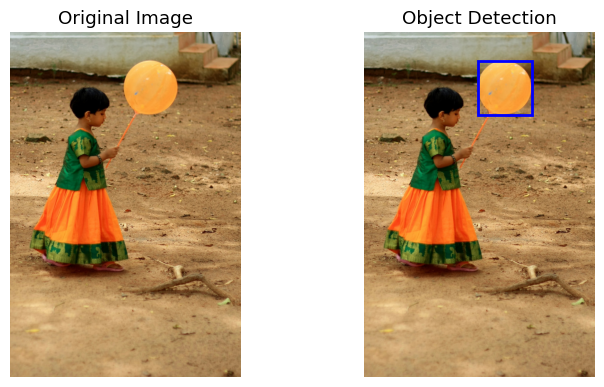

In [ ]:
plot_bbox(val_img[10],val_ann[10])

In [ ]:
%cd /content/test/balloon

!mkdir images
!mkdir labels

!mkdir images/train
!mkdir images/val
!mkdir labels/train
!mkdir labels/val

/content/test/balloon


In [ ]:
ordnung('/content/test/balloon/train',        # folder_old
        '/content/test/balloon/images/train', # folder_new
        'jpg')

ordnung('/content/test/balloon/train',        # folder_old
        '/content/test/balloon/labels/train', # folder_new
        'txt')

ordnung('/content/test/balloon/val',        # folder_old
        '/content/test/balloon/images/val', # folder_new
        'jpg')

ordnung('/content/test/balloon/val',        # folder_old
        '/content/test/balloon/labels/val', # folder_new
        'txt')

In [ ]:
!rm -rf /content/test/balloon/train
!rm -rf /content/test/balloon/val

In [ ]:
val_img = vnedrenie(val_img, 'images', -2)
val_ann = vnedrenie(val_ann, 'labels', -2)
train_img = vnedrenie(train_img, 'images', -2)
train_ann = vnedrenie(train_ann, 'labels', -2)

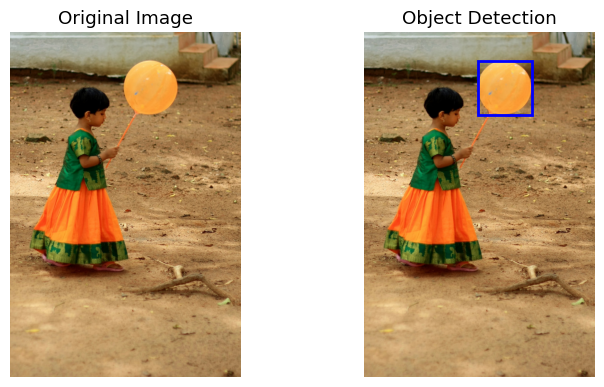

In [ ]:
plot_bbox(val_img[10],val_ann[10])

In [ ]:
val_ann

['/content/test/balloon/labels/val/24631331976_defa3bb61f_k.txt',
 '/content/test/balloon/labels/val/16335852991_f55de7958d_k.txt',
 '/content/test/balloon/labels/val/14898532020_ba6199dd22_k.txt',
 '/content/test/balloon/labels/val/8053085540_a72bd21a64_k.txt',
 '/content/test/balloon/labels/val/6810773040_3d81036d05_k.txt',
 '/content/test/balloon/labels/val/5603212091_2dfe16ea72_b.txt',
 '/content/test/balloon/labels/val/5555705118_3390d70abe_b.txt',
 '/content/test/balloon/labels/val/4838031651_3e7b5ea5c7_b.txt',
 '/content/test/balloon/labels/val/4581425993_72b9b15fc0_b.txt',
 '/content/test/balloon/labels/val/3825919971_93fb1ec581_b.txt',
 '/content/test/balloon/labels/val/3800636873_ace2c2795f_b.txt',
 '/content/test/balloon/labels/val/2917282960_06beee649a_b.txt',
 '/content/test/balloon/labels/val/410488422_5f8991f26e_b.txt']

In [ ]:
data_yaml_path = os.path.join('/content/test/balloon','data_.yaml' )

string = \
'''train: /content/test/balloon/images/train
val: /content/test/balloon/images/val

# number of classes
# nc: 1

# class names
names:
  0: balloon
'''
with open(data_yaml_path,'w') as f:
  f.writelines(string)
  f.close()

## проверка YOLO (выполнять не обязательно)

In [ ]:
test = '/15290896925_884ab33fd3_k.jpg'

### проверка YOLOv5

In [ ]:
%cd /content/yolov5/

# предсказание модели (CLI)
start_time = time.time()

!python detect.py \
--weights yolov5l.pt \
--img 640 \
--conf 0.3 \
--source '/content/test/balloon/images/train'{test} \
--exist-ok \
--line-thickness 10 \
--hide-labels

detect_time = time.time() - start_time

/content/yolov5
detect: weights=['yolov5l.pt'], source=/content/test/balloon/images/train/15290896925_884ab33fd3_k.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.3, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=True, line_thickness=10, hide_labels=True, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-312-g1bcd17ee Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5l summary: 367 layers, 46533693 parameters, 0 gradients, 109.0 GFLOPs
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/1 /content/test/balloon/images/train/15290896925_884ab33fd3_k.jpg: 448x640 20 persons, 1 backpack, 1 handbag, 83.5ms
Speed: 1.1ms pre-process, 83.5ms inference, 907.7ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect

время работы модели = 9.0 [c]


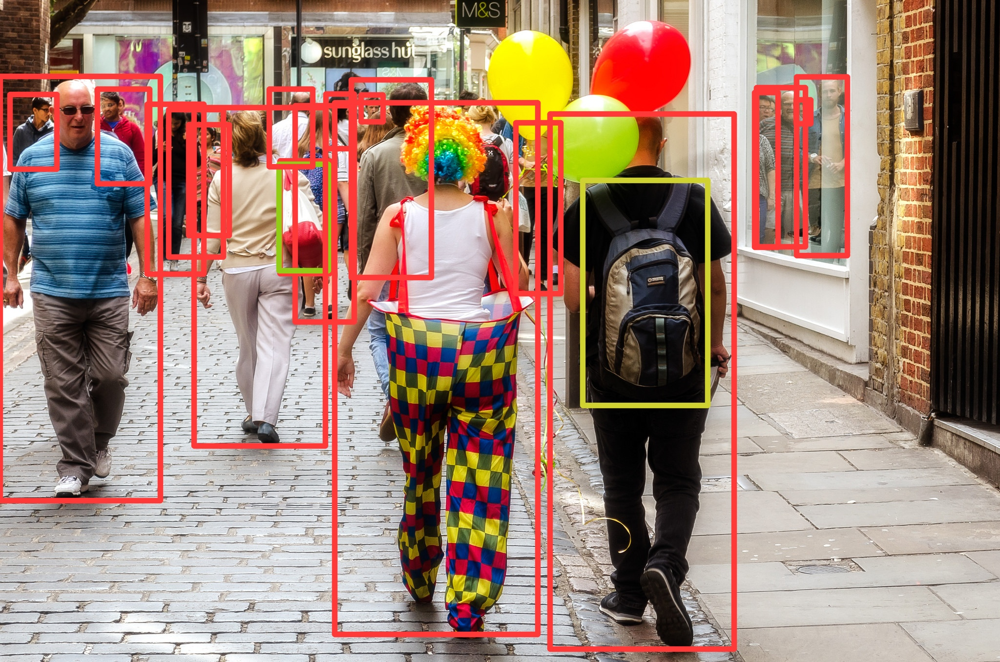

In [ ]:
print('время работы модели =' , round(detect_time,0), '[c]')
display.Image(filename='/content/yolov5/runs/detect/exp' + test,
              width=400)

### проверка YOLOv8

In [ ]:
%cd /content/yolov8

# предсказание модели (SDK)
start_time = time.time()

model = model_yolov8l
model.predict('/content/test/balloon/images/train' + test,
              save=True,
              imgsz=640,
              conf=0.3,
              show_labels=False,
              exist_ok=True)

detect_time = time.time() - start_time

/content/yolov8

image 1/1 /content/test/balloon/images/train/15290896925_884ab33fd3_k.jpg: 448x640 17 persons, 2 backpacks, 1 handbag, 138.6ms
Speed: 18.8ms preprocess, 138.6ms inference, 2.2ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs/detect/predict


время работы модели = 1.0 [c]


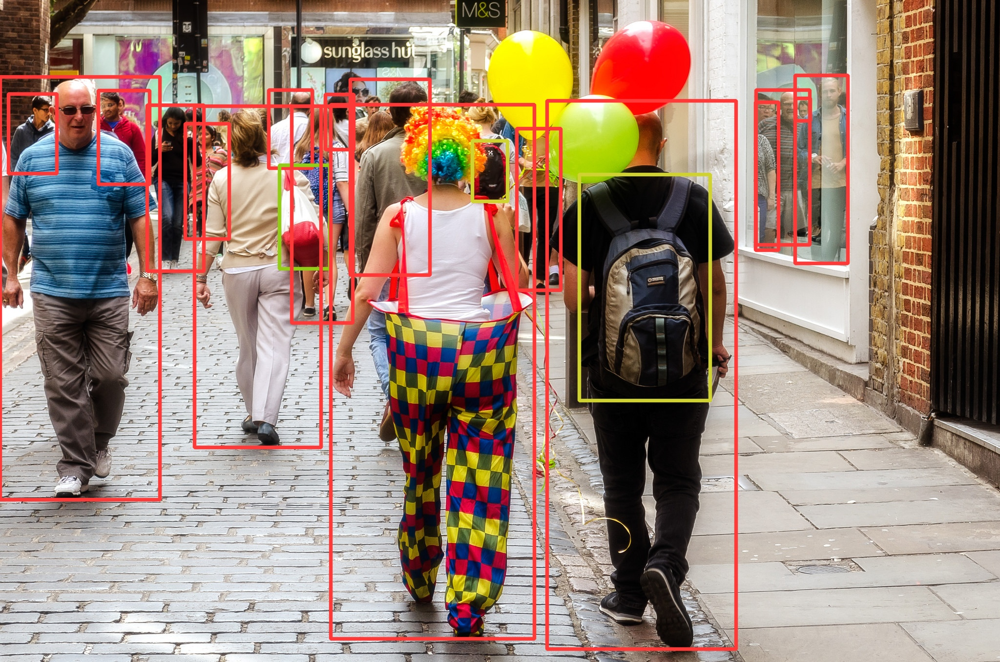

In [ ]:
print('время работы модели =' , round(detect_time,0), '[c]')
display.Image(filename='/content/yolov8/runs/detect/predict' + test,
              width=400)

## обучение YOLO  (выполнять не обязательно)

### база

In [ ]:
# !rm -rf /content/yolov5/runs/*

In [ ]:
%cd /content/test/balloon/images/train
!find -type f | wc -l

/content/test/balloon/images/train
61


In [ ]:
%cd /content/test/balloon/images/val
!find -type f | wc -l

/content/test/balloon/images/val
13


In [ ]:
# скачал тестовую картинку 1
url = 'https://images.hdqwalls.com/download/girl-jumping-joy-balloons-4k-fo-1280x1024.jpg'
image_file_1 = '/content/test/ball_1.jpg'
!wget -q -O {image_file_1} {url}

In [ ]:
# скачал тестовую картинку 2
url = 'https://i.pinimg.com/736x/1b/a4/fb/1ba4fb53a80480f54c3b7c539329587e.jpg'
image_file_2 = '/content/test/ball_2.jpg'
!wget -q -O {image_file_2} {url}

### обучение YOLOv5

In [ ]:
%cd /content/yolov5/

# обучение custom модели yolov5
start_time = time.time()

!python train.py \
--weights yolov5l.pt \
--img 640 \
--batch 16 \
--epochs 30 \
--data /content/test/balloon/data_.yaml \
--exist-ok

detect_time = time.time() - start_time

/content/yolov5
2024-05-13 19:50:24.064857: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-13 19:50:24.064904: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-13 19:50:24.171657: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5l.pt, cfg=, data=/content/test/balloon/data_.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=30, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=None, image_weights=False, device=, mul

In [ ]:
print('время обучения модели =' , round(detect_time,0), '[c]')

время обучения модели = 483.0 [c]


/content/yolov5


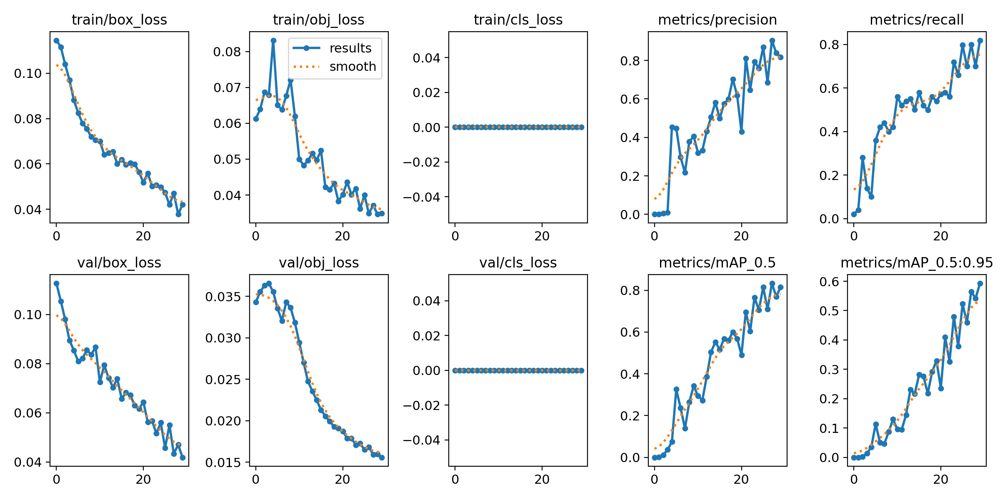

In [ ]:
# результат custom модели yolov5
%cd /content/yolov5/
plot_results('/content/yolov5/runs/train/exp/results.csv')  # plot 'results.csv' as 'results.png'
display.Image(filename='/content/yolov5/runs/train/exp/results.png', width=640)

In [ ]:
%cd /content/yolov5/

# предсказание custom модели yolov5
start_time = time.time()

!python detect.py \
--weights /content/yolov5/runs/train/exp/weights/best.pt \
--img 640 \
--conf 0.75 \
--source {image_file_1} \
--exist-ok \
--line-thickness 1 \
# --hide-labels

detect_time = time.time() - start_time

/content/yolov5
detect: weights=['/content/yolov5/runs/train/exp/weights/best.pt'], source=/content/test/ball_1.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.75, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=True, line_thickness=1, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-312-g1bcd17ee Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 267 layers, 46108278 parameters, 0 gradients, 107.6 GFLOPs
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/1 /content/test/ball_1.jpg: 512x640 44 balloons, 79.2ms
Speed: 0.6ms pre-process, 79.2ms inference, 837.0ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp


время работы модели = 10.0 [c]


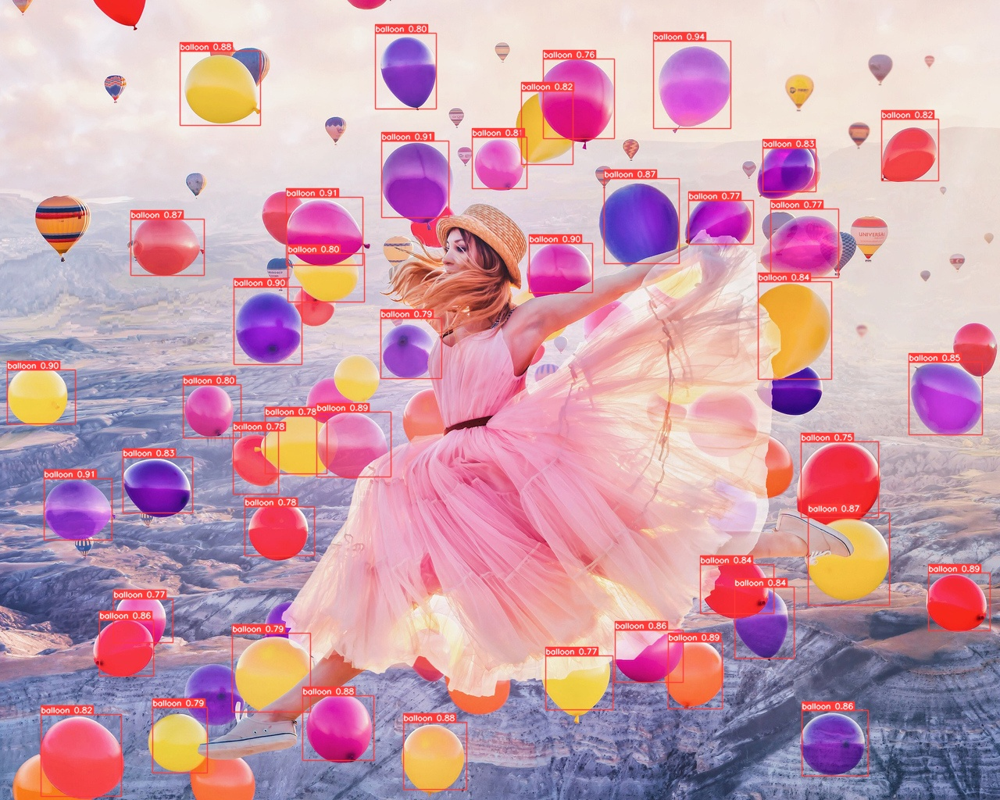

In [ ]:
print('время работы модели =' , round(detect_time,0), '[c]')
display.Image(filename='/content/yolov5/runs/detect/exp/ball_1.jpg',
              width=500)

### обучение YOLOv8

In [ ]:
%cd /content/yolov8

# обучение custom модели yolov8
start_time = time.time()

!yolo \
task=detect \
mode=train \
model=yolov8l.pt \
imgsz=640 \
batch=8 \
epochs=60 \
data=/content/test/balloon/data_.yaml \
exist_ok=True

# project=/content/test \
# name='yolov8l_30e'

detect_time = time.time() - start_time

/content/yolov8
Ultralytics YOLOv8.2.15 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8l.pt, data=/content/test/balloon/data_.yaml, epochs=60, time=None, patience=100, batch=8, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=True, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, s

In [ ]:
print('время обучения модели =' , round(detect_time,0), '[c]')

время обучения модели = 454.0 [c]


/content/yolov8


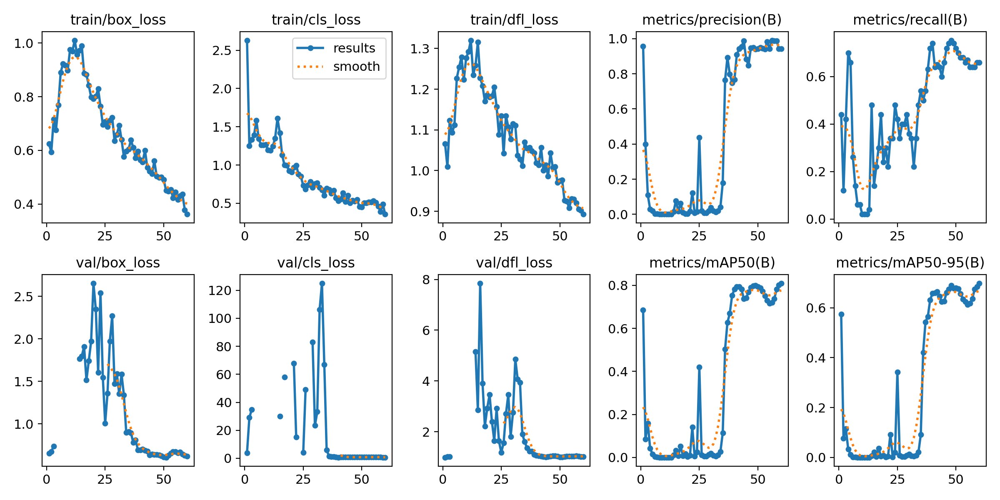

In [ ]:
# результат custom модели yolov8
%cd /content/yolov8/
plot_results('/content/yolov8/runs/detect/train3/results.csv')  # plot 'results.csv' as 'results.png'
display.Image(filename='/content/yolov8/runs/detect/train3/results.png', width=640)

In [ ]:
%cd /content/yolov8

# предсказание custom модели yolov8
start_time = time.time()

!yolo \
task=detect \
mode=predict \
model=/content/yolov8/runs/detect/train/weights/best.pt \
conf=0.75 \
source={image_file_1} \
exist_ok=True \
show_labels=False
# save=True

detect_time = time.time() - start_time

/content/yolov8
Ultralytics YOLOv8.2.15 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 268 layers, 43607379 parameters, 0 gradients, 164.8 GFLOPs

image 1/1 /content/test/ball_1.jpg: 512x640 46 balloons, 94.1ms
Speed: 2.6ms preprocess, 94.1ms inference, 3095.8ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs/detect/predict
💡 Learn more at https://docs.ultralytics.com/modes/predict


время работы модели = 9.0 [c]


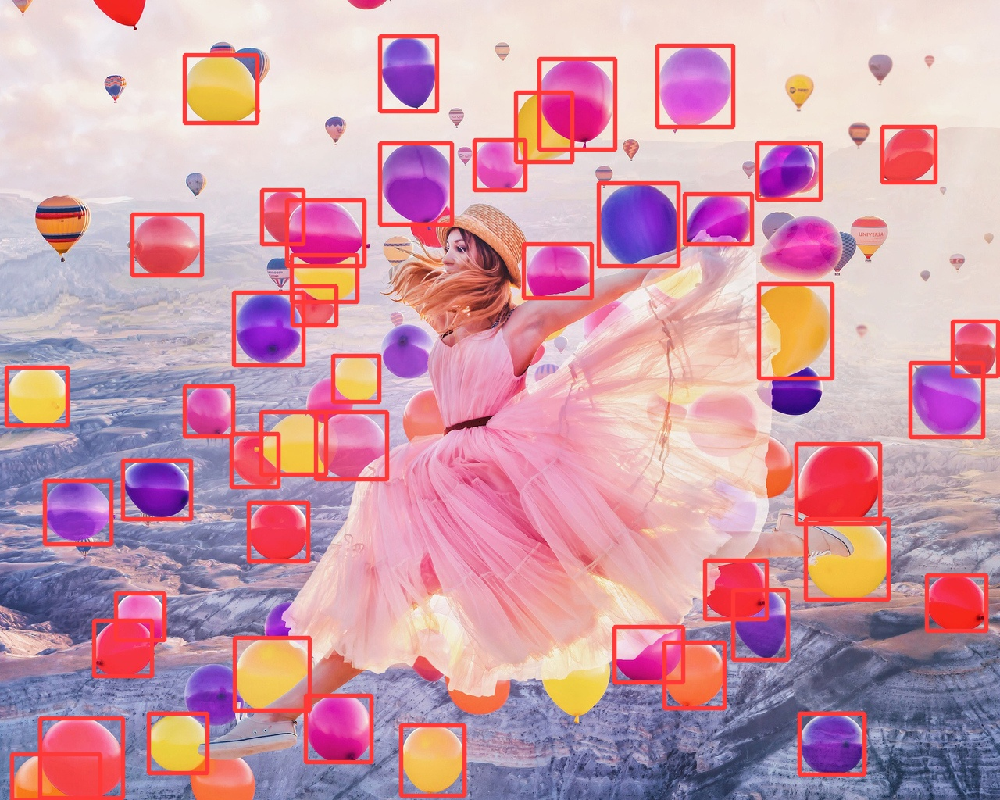

In [ ]:
print('время работы модели =' , round(detect_time,0), '[c]')
display.Image(filename='/content/yolov8/runs/detect/predict/ball_1.jpg',
              width=500)

# 3. Детектирование дефектов

In [ ]:
# test_ = '/content/yolov5/data/images/bus.jpg'
# Image.open(test_)

In [ ]:
def list_of_files_in_folder(path):
  %cd {path}

  list_type = []
  for file in glob.glob("*"):
    file = path + file
    list_type.append(file)
    list_type.sort()

  return list_type

In [ ]:
%cd /content

!mkdir ml

%cd /content/ml

!mkdir defects
!mkdir images
!mkdir labels

!mkdir images/train
!mkdir images/val
!mkdir labels/train
!mkdir labels/val

/content
/content/ml


In [ ]:
ordnung('/content/vkr/train',        # folder_old
        '/content/ml/images/train', # folder_new
        'jpg')

ordnung('/content/vkr/train',        # folder_old
        '/content/ml/labels/train', # folder_new
        'txt')

ordnung('/content/vkr/val',        # folder_old
        '/content/ml/images/val', # folder_new
        'jpg')

ordnung('/content/vkr/val',        # folder_old
        '/content/ml/labels/val', # folder_new
        'txt')

In [ ]:
# !cp -rT /content/vkr/img /content/vkr/defects/img
# !cp -rT /content/vkr/json /content/vkr/defects/json

In [ ]:
# !rm -rf /content/vkr/img
# !rm -rf /content/vkr/json
# !rm -rf /content/vkr/train
# !rm -rf /content/vkr/val

In [ ]:
path1 = '/content/ml/images/val/'
path2 = '/content/ml/labels/val/'
path3 = '/content/ml/images/train/'
path4 = '/content/ml/labels/train/'

val_img = list_of_files_in_folder(path1)
val_ann = list_of_files_in_folder(path2)
train_img = list_of_files_in_folder(path3)
train_ann = list_of_files_in_folder(path4)

/content/ml/images/val
/content/ml/labels/val
/content/ml/images/train
/content/ml/labels/train


In [ ]:
print(len(train_img), len(val_img))

260 148


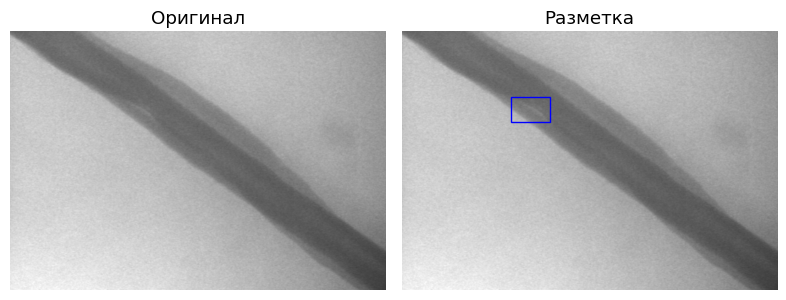

In [ ]:
plot_bbox(val_img[110],val_ann[110])

In [ ]:
data_yaml_path = os.path.join('/content/ml','data_.yaml' )

string = \
'''train: /content/ml/images/train
val: /content/ml/images/val

# number of classes
# nc: 1

# class names
names:
  0: unfused
'''
with open(data_yaml_path,'w') as f:
  f.writelines(string)
  f.close()

In [ ]:
%cd /content/yolov5/

# обучение custom модели yolov5
start_time = time.time()

!python train.py \
--weights yolov5s.pt \
--img 640 \
--batch 16 \
--epochs 30 \
--data /content/ml/data_.yaml \
--exist-ok

detect_time = time.time() - start_time

/content/yolov5
2024-05-18 18:15:27.386186: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-18 18:15:27.386253: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-18 18:15:27.388381: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5s.pt, cfg=, data=/content/ml/data_.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=30, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=F

In [ ]:
print('время обучения модели =' , round(detect_time,0), '[c]')

время обучения модели = 717.0 [c]


In [ ]:
# время обучения модели:
# YOLOv5l - air-hole - 2990.0
# YOLOv5m - unfused - 817.0
# YOLOv5s - unfused - 717.0

/content/yolov5


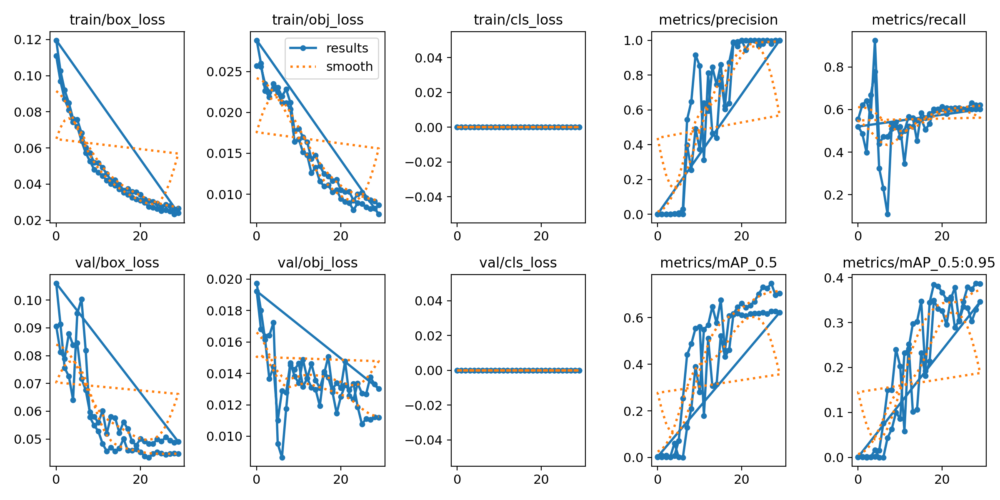

In [ ]:
# результат модели
%cd /content/yolov5/
plot_results('/content/yolov5/runs/train/exp/results.csv')  # plot 'results.csv' as 'results.png'
display.Image(filename='/content/yolov5/runs/train/exp/results.png', width=640)

In [ ]:
!zip -r \
/content/yolov5/runs/train/exp/weights/best.zip \
/content/yolov5/runs/train/exp/weights/best.pt

  adding: content/yolov5/runs/train/exp/weights/best.pt (deflated 8%)


In [ ]:
# определил путь к папке со снимками для предсказания
test = val_img[0].split('/')[:-1]
test = '/'.join(test)
test

'/content/ml/images/val'

In [ ]:
# number = 40
# test = val_img[number]
# test

'/content/vkr/images/val/unfused3-41.jpg'

In [ ]:
%cd /content/yolov5/

# предсказание custom модели yolov5
start_time = time.time()

!python detect.py \
--weights /content/yolov5/runs/train/exp/weights/best.pt \
--img 640 \
--conf 0.15 \
--source {test} \
--exist-ok \
--line-thickness 1 \
--hide-labels

detect_time = time.time() - start_time

/content/yolov5
detect: weights=['/content/yolov5/runs/train/exp/weights/best.pt'], source=/content/ml/images/val, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.15, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=True, line_thickness=1, hide_labels=True, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-313-g712de55a Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/148 /content/ml/images/val/unfused5-00.jpg: 448x640 1 unfused, 53.1ms
image 2/148 /content/ml/images/val/unfused5-01.jpg: 448x640 1 unfused, 9.4ms
image 3/148 /content/ml/images/val/unfused5-02.jpg: 448x640 1 unfused, 19.9ms
image 4/148 /content/

In [ ]:
print('время предсказания модели =' , round(detect_time,0), '[c]')

время предсказания модели = 16.0 [c]


In [ ]:
predict_img = []
for elem in val_img:
  path = elem.split('/')[-1]
  path = '/content/yolov5/runs/detect/exp/' + path
  predict_img.append(path)
print(len(predict_img))

148


In [ ]:
# print('время работы модели =' , round(detect_time,0), '[c]')
# filename = '/content/yolov5/runs/detect/exp/' + test.split('/')[-1]
# display.Image(filename=filename,
#               width=500)

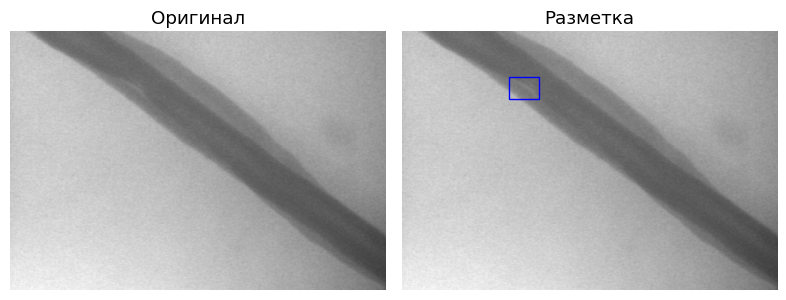

In [ ]:
number = 114
plot_bbox(predict_img[number],val_ann[number])

#                 предиктед                    |               предиктед + разметка

In [ ]:
# !rm -rf /content/yolov5/runs/detect/exp/.ipynb_checkpoints

In [ ]:
%cd /content/ml
!mkdir video

/content/ml


In [ ]:
# Folder which contains all the images from which video is to be generated
path = '/content/yolov5/runs/detect/exp'
os.chdir(path)

mean_height = 0
mean_width = 0

num_of_images = len(os.listdir('.'))

for file in os.listdir('.'):
    im = Image.open(os.path.join(path, file))
    width, height = im.size
    mean_width += width
    mean_height += height
    # im.show()   # uncomment this for displaying the image

# Finding the mean height and width of all images.
# This is required because the video frame needs
# to be set with same width and height. Otherwise
# images not equal to that width height will not get
# embedded into the video
mean_width = int(mean_width / num_of_images)
mean_height = int(mean_height / num_of_images)

# print(mean_height)
# print(mean_width)

# Resizing of the images to give them same width and height
for file in os.listdir('.'):
    if file.endswith(".jpg") or file.endswith(".jpeg") or file.endswith("png"):
        # opening image using PIL Image
        im = Image.open(os.path.join(path, file))

        # im.size includes the height and width of image
        width, height = im.size
        '''Чурилов закомментил:''' # print(width, height)

        # resizing
        imResize = im.resize((mean_width, mean_height), Image.ANTIALIAS)
        imResize.save( file, 'JPEG', quality = 95) # setting quality
        # printing each resized image name
        '''Чурилов закомментил:''' # print(im.filename.split('\\')[-1], " is resized")

<ipython-input-123-47e02103b732>:39: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  imResize = im.resize((mean_width, mean_height), Image.ANTIALIAS)


In [ ]:
# путь в функции надо настроить (не доделал)
video_name = 'unfused.avi'
generate_video(path, video_name)

['unfused5-00.jpg', 'unfused5-01.jpg', 'unfused5-02.jpg', 'unfused5-03.jpg', 'unfused5-04.jpg', 'unfused5-05.jpg', 'unfused5-06.jpg', 'unfused5-07.jpg', 'unfused5-08.jpg', 'unfused5-09.jpg', 'unfused5-10.jpg', 'unfused5-11.jpg', 'unfused5-13.jpg', 'unfused5-14.jpg', 'unfused5-15.jpg', 'unfused5-16.jpg', 'unfused5-17.jpg', 'unfused5-18.jpg', 'unfused5-19.jpg', 'unfused5-20.jpg', 'unfused5-21.jpg', 'unfused5-22.jpg', 'unfused5-23.jpg', 'unfused5-24.jpg', 'unfused5-25.jpg', 'unfused5-26.jpg', 'unfused5-27.jpg', 'unfused5-28.jpg', 'unfused5-29.jpg', 'unfused5-30.jpg', 'unfused5-31.jpg', 'unfused5-32.jpg', 'unfused5-33.jpg', 'unfused5-34.jpg', 'unfused5-35.jpg', 'unfused5-36.jpg', 'unfused5-37.jpg', 'unfused5-38.jpg', 'unfused5-39.jpg', 'unfused5-40.jpg', 'unfused5-41.jpg', 'unfused5-42.jpg', 'unfused5-43.jpg', 'unfused5-44.jpg', 'unfused5-45.jpg', 'unfused5-46.jpg', 'unfused5-47.jpg', 'unfused5-48.jpg', 'unfused5-49.jpg', 'unfused5-50.jpg', 'unfused5-51.jpg', 'unfused5-52.jpg', 'unfused5-5

In [ ]:
!zip -r /content/ml/video/unfused.zip /content/ml/video/unfused.avi

  adding: content/ml/video/unfused.avi (deflated 80%)


# Tests

In [ ]:
import matplotlib.pyplot as plt

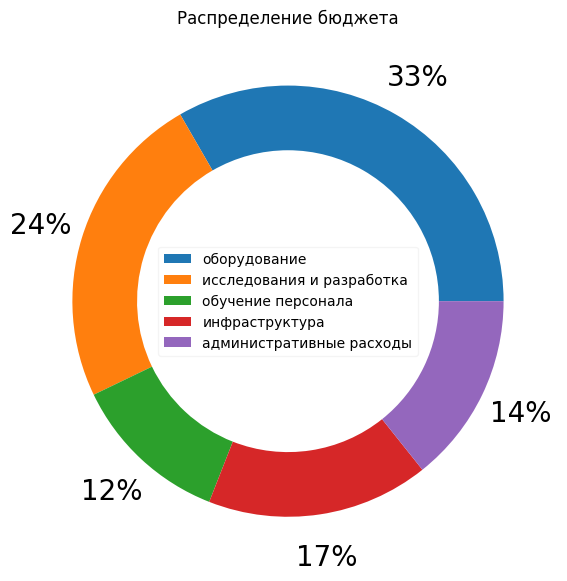

In [ ]:
# Распределение бюджета
list_reason_n = [14,10,5,7,6]
list_reason_l = ['оборудование',
                 'исследования и разработка',
                 'обучение персонала',
                 'инфраструктура',
                 'административные расходы']

plt.figure(figsize=(7,7),
           facecolor='white')
plt.pie(list_reason_n,
        autopct='%1.0f%%',
        pctdistance=1.2,
        wedgeprops=dict(width=0.3),
        textprops={'fontsize': 20}
        )
plt.legend(loc='center',
           labels=list_reason_l,
           framealpha=0.2)
plt.title("Распределение бюджета")
plt.show()

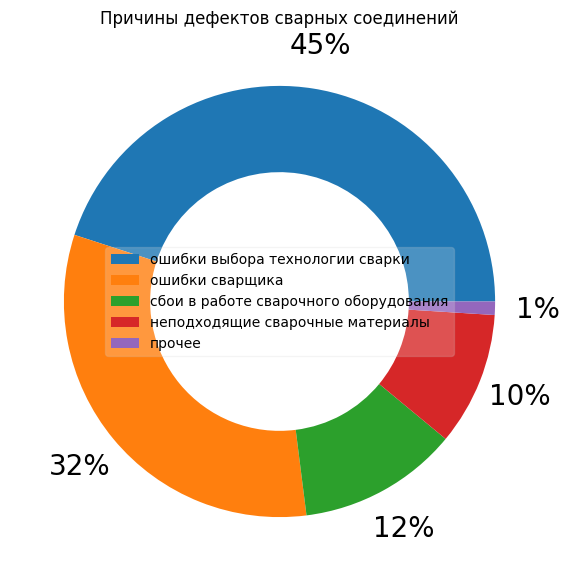

In [ ]:
# Причины дефектов сварных соединений
list_reason_n = [45,32,12,10,1]
list_reason_l = ['ошибки выбора технологии сварки',
                 'ошибки сварщика',
                 'сбои в работе сварочного оборудования',
                 'неподходящие сварочные материалы',
                 'прочее']

plt.figure(figsize=(7,7),
           facecolor='white')
plt.pie(list_reason_n,
        autopct='%1.0f%%',
        pctdistance=1.2,
        wedgeprops=dict(width=0.4),
        textprops={'fontsize': 20}
        )
plt.legend(loc='center',
           labels=list_reason_l,
           framealpha=0.2)
plt.title("Причины дефектов сварных соединений")
plt.show()

In [ ]:
# Причины дефектов сварных соединений
list_size_yolov8 = [21.5,49.7,83.7,131]
list_size_yolov5 = [14.1,40.8,89.3,166]
list_labels = ['s','m','l','x']

In [ ]:
/content/yolov8
Downloading https://github.com/ultralytics/assets/releases/download/v8.2.0/yolov8s.pt to 'yolov8s.pt'...
100%|██████████| 21.5M/21.5M [00:00<00:00, 50.9MB/s]
Downloading https://github.com/ultralytics/assets/releases/download/v8.2.0/yolov8m.pt to 'yolov8m.pt'...
100%|██████████| 49.7M/49.7M [00:00<00:00, 123MB/s]
Downloading https://github.com/ultralytics/assets/releases/download/v8.2.0/yolov8l.pt to 'yolov8l.pt'...
100%|██████████| 83.7M/83.7M [00:00<00:00, 140MB/s]
Downloading https://github.com/ultralytics/assets/releases/download/v8.2.0/yolov8x.pt to 'yolov8x.pt'...
100%|██████████| 131M/131M [00:00<00:00, 235MB/s]

In [ ]:
YOLOv5 🚀 2024-5-19 Python-3.10.12 torch-2.2.1+cu121 CPU

Downloading https://github.com/ultralytics/yolov5/releases/download/v7.0/yolov5s.pt to yolov5s.pt...
100%|██████████| 14.1M/14.1M [00:00<00:00, 133MB/s]
Downloading https://github.com/ultralytics/yolov5/releases/download/v7.0/yolov5m.pt to yolov5m.pt...
100%|██████████| 40.8M/40.8M [00:00<00:00, 187MB/s]
Downloading https://github.com/ultralytics/yolov5/releases/download/v7.0/yolov5l.pt to yolov5l.pt...
100%|██████████| 89.3M/89.3M [00:00<00:00, 206MB/s]
Downloading https://github.com/ultralytics/yolov5/releases/download/v7.0/yolov5x.pt to yolov5x.pt...
100%|██████████| 166M/166M [00:00<00:00, 238MB/s]

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

In [ ]:
!mkdir pictures

%cd /content/pictures

/content/pictures


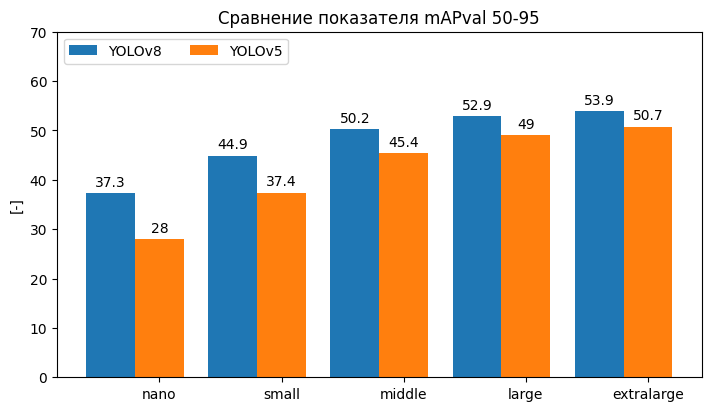

In [ ]:
species = ("nano", "small", "middle", "large", "extralarge")
size_models = {
    'YOLOv8': (37.3,44.9,50.2,52.9,53.9),
    'YOLOv5': (28.0,37.4,45.4,49.0,50.7),
}

x = np.arange(len(species))  # the label locations
width = 0.4  # the width of the bars
multiplier = 0

fig, ax = plt.subplots(layout='constrained')

for attribute, measurement in size_models.items():
    offset = width * multiplier
    rects = ax.bar(x + offset, measurement, width, label=attribute)
    ax.bar_label(rects, padding=3)
    multiplier += 1

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('[-]')
ax.set_title('Сравнение показателя mAPval 50-95')
ax.set_xticks(x + width, species)
ax.legend(loc='upper left', ncols=3)
ax.set_ylim(0, 70)
fig.set_size_inches(7, 4)

plt.savefig(fname = 'mAPval')
plt.show()

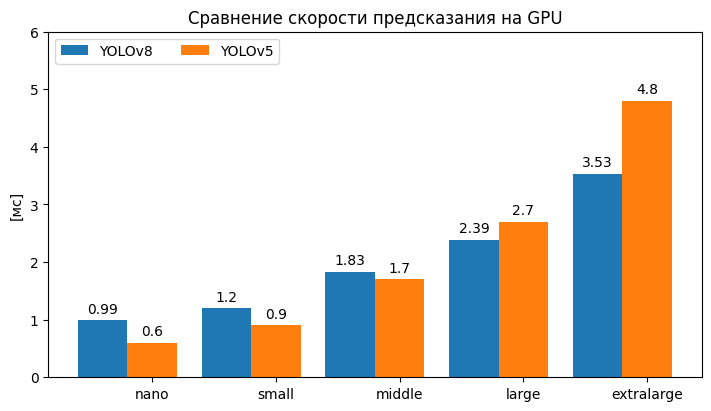

In [ ]:
species = ("nano", "small", "middle", "large", "extralarge")
size_models = {
    'YOLOv8': (0.99,1.2,1.83,2.39,3.53),
    'YOLOv5': (0.6,0.9,1.7,2.7,4.8),
}

x = np.arange(len(species))  # the label locations
width = 0.4  # the width of the bars
multiplier = 0

fig, ax = plt.subplots(layout='constrained')

for attribute, measurement in size_models.items():
    offset = width * multiplier
    rects = ax.bar(x + offset, measurement, width, label=attribute)
    ax.bar_label(rects, padding=3)
    multiplier += 1

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('[мс]')
ax.set_title('Сравнение скорости предсказания на GPU')
ax.set_xticks(x + width, species)
ax.legend(loc='upper left', ncols=3)
ax.set_ylim(0, 6)
fig.set_size_inches(7, 4)

plt.savefig(fname = 'GPU')
plt.show()

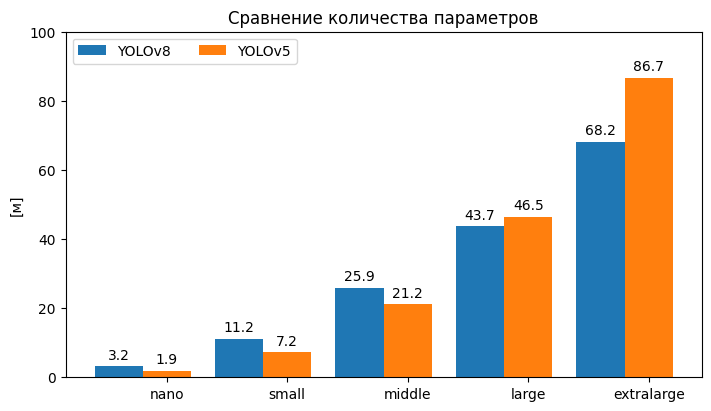

In [ ]:
species = ("nano", "small", "middle", "large", "extralarge")
size_models = {
    'YOLOv8': (3.2,11.2,25.9,43.7,68.2),
    'YOLOv5': (1.9,7.2,21.2,46.5,86.7),
}

x = np.arange(len(species))  # the label locations
width = 0.4  # the width of the bars
multiplier = 0

fig, ax = plt.subplots(layout='constrained')

for attribute, measurement in size_models.items():
    offset = width * multiplier
    rects = ax.bar(x + offset, measurement, width, label=attribute)
    ax.bar_label(rects, padding=3)
    multiplier += 1

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('[м]')
ax.set_title('Сравнение количества параметров')
ax.set_xticks(x + width, species)
ax.legend(loc='upper left', ncols=3)
ax.set_ylim(0, 100)
fig.set_size_inches(7, 4)

plt.savefig(fname = 'количествo параметров')
plt.show()

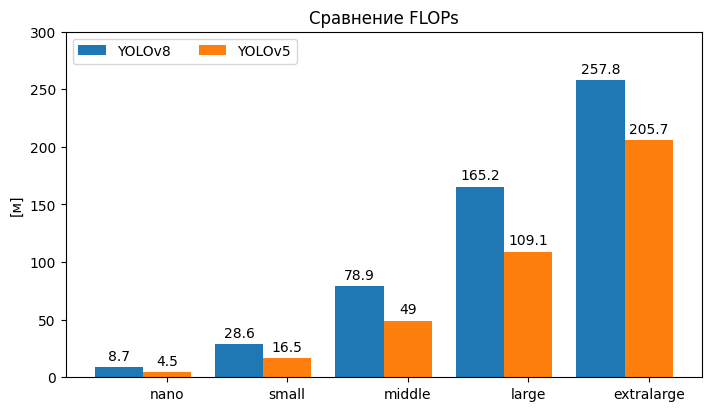

In [ ]:
species = ("nano", "small", "middle", "large", "extralarge")
size_models = {
    'YOLOv8': (8.7,28.6,78.9,165.2,257.8),
    'YOLOv5': (4.5,16.5,49,109.1,205.7),
}

x = np.arange(len(species))  # the label locations
width = 0.4  # the width of the bars
multiplier = 0

fig, ax = plt.subplots(layout='constrained')

for attribute, measurement in size_models.items():
    offset = width * multiplier
    rects = ax.bar(x + offset, measurement, width, label=attribute)
    ax.bar_label(rects, padding=3)
    multiplier += 1

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('[м]')
ax.set_title('Сравнение FLOPs')
ax.set_xticks(x + width, species)
ax.legend(loc='upper left', ncols=3)
ax.set_ylim(0, 300)
fig.set_size_inches(7, 4)

plt.savefig(fname = 'FLOPs')
plt.show()

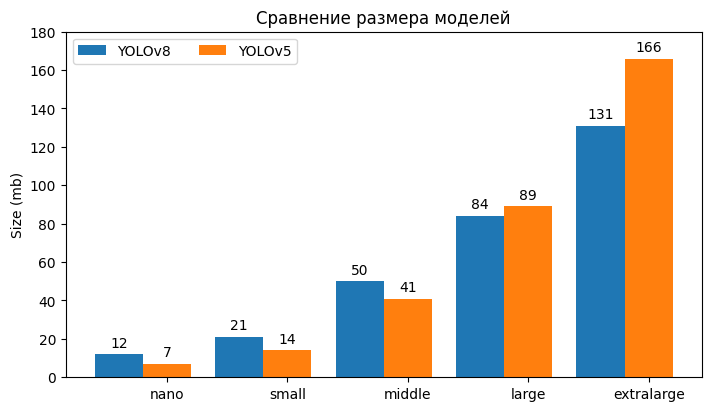

In [ ]:
species = ("nano", "small", "middle", "large", "extralarge")
size_models = {
    'YOLOv8': (12,21,50,84,131),
    'YOLOv5': (7,14,41,89,166),
}

x = np.arange(len(species))  # the label locations
width = 0.4  # the width of the bars
multiplier = 0

fig, ax = plt.subplots(layout='constrained')

for attribute, measurement in size_models.items():
    offset = width * multiplier
    rects = ax.bar(x + offset, measurement, width, label=attribute)
    ax.bar_label(rects, padding=3)
    multiplier += 1

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Size (mb)')
ax.set_title('Сравнение размера моделей')
ax.set_xticks(x + width, species)
ax.legend(loc='upper left', ncols=3)
ax.set_ylim(0, 180)
fig.set_size_inches(7, 4)

plt.savefig(fname = 'размер')
plt.show()

## Куча команд

In [ ]:
# os.chdir('/content/steel-pipe-weld-defect-detection/steel-tube-dataset-processing-and-analysis')
#------------------------------------------------
# !du -sh * # Disk Usage
#------------------------------------------------
# !zip -r /content/images.zip /content/steel-pipe-weld-defect-detection/steel-tube-dataset-processing-and-analysis/images
#------------------------------------------------
# !mv '/content/vkr/img_/img air-hole part_1' '/content/vkr/img_/img_air-hole_part_1' # убрал пробелы в названиии
#------------------------------------------------
# !git clone https://github.com/AlekseyChurilov/...
#------------------------------------------------
# !zip -r /content/json.zip /content/steel-pipe-weld-defect-detection/steel-tube-dataset-processing-and-analysis/json
        # куда              что
#------------------------------------------------
# rename
# old_file = os.path.join("/content", "234.jpg")
# new_file = os.path.join("/content", "Tajmahal.jpg")
# os.rename(old_file, new_file)
#------------------------------------------------
# uploaded = files.upload()

## Кадрирование

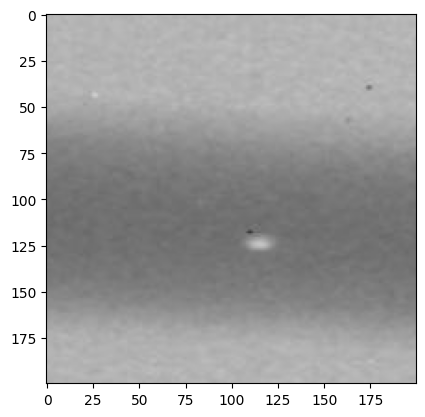

In [ ]:
cropped_img = img[150:350, 300:500]
plt.imshow(cropped_img)
plt.show()

## Изменение размера

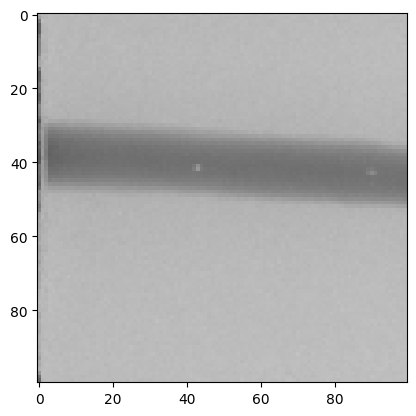

In [ ]:
resized_img = cv2.resize(img, (100, 100), interpolation = cv2.INTER_AREA)
plt.imshow(resized_img)
plt.show()

## Рисование прямоугольников

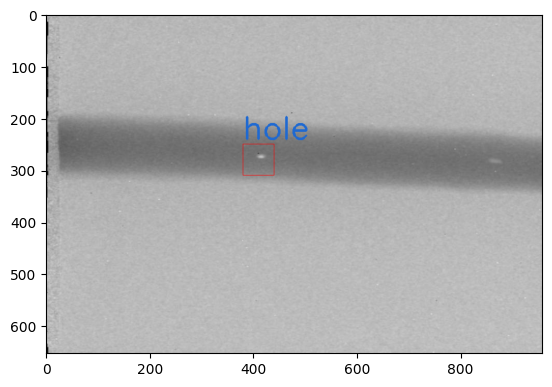

In [ ]:
output = img.copy()
cv2.rectangle(output, (380,250), (440,310), (255, 0, 0), 1)
cv2.putText(output, "hole", (380, 250-10), cv2.FONT_HERSHEY_SIMPLEX, 2, (30, 105, 210), 4)
plt.imshow(output)
plt.show()

## Градации серого и threshold

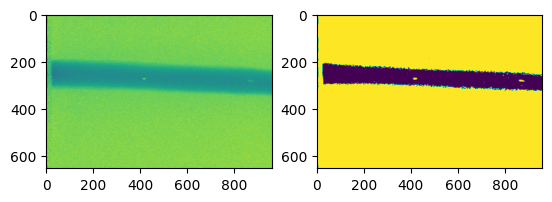

In [ ]:
gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
_, thresholded_img = cv2.threshold(gray_img, 127, 255, 0)
plt.subplot(121)
plt.imshow(gray_img)
plt.subplot(122)
plt.imshow(thresholded_img)
plt.show()

Мы столкнулись с проблемой отображения одномерных изображений, надо отдельно указывать цветовую карту. Сделаем это.

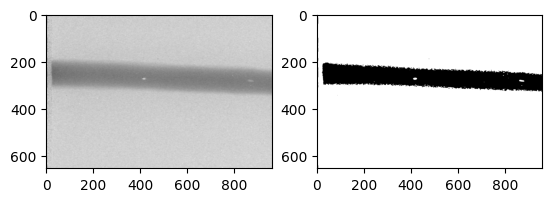

In [ ]:
gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
_, thresholded_img = cv2.threshold(gray_img, 130, 255, 0)
plt.subplot(121)
plt.imshow(gray_img, cmap='gray')
plt.subplot(122)
plt.imshow(thresholded_img, cmap='gray')
plt.show()

## Фильтры

In [ ]:
img.shape

(653, 958, 3)

In [ ]:
noise = np.random.randint(0, 255, (653, 958,3)).astype(np.uint8)
noisy_img = cv2.addWeighted(img, 0.7, noise, 0.3, 2.2) # кстати, это способ получить смесь изображений

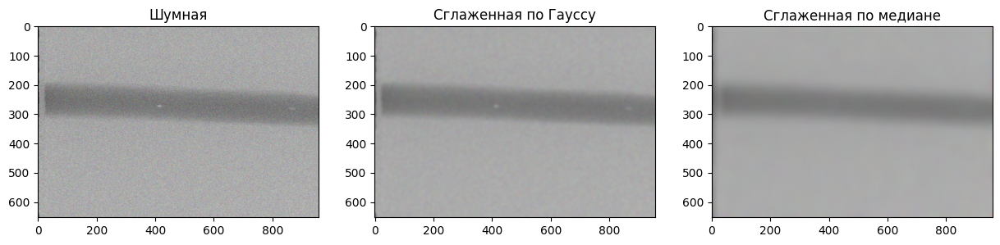

In [ ]:
gblurred_img = cv2.GaussianBlur(noisy_img, (21, 21), 0)
mblurred_img = cv2.medianBlur(noisy_img, 45)
plt.figure(figsize=(15, 5))

plt.subplot(131)
plt.title('Шумная')
plt.imshow(noisy_img)

plt.subplot(132)
plt.title('Сглаженная по Гауссу')
plt.imshow(gblurred_img)

plt.subplot(133)
plt.title('Сглаженная по медиане')
plt.imshow(mblurred_img)

plt.show()